# **Introduction to Feature Representations, Then and Now**
 

The goal of this introductory-level tutorial is to show different techniques for face recognition and identifying similar faces. For this, as you can see, Google Colab is used as it is the ideal platform for a first hands-on experience. 

In order to perform face recognition, one has to know what exactly defines the faces of interest and how they can be differentiated mutually. Therefore, it is important to learn a robust and discriminative feature representation of the faces so that detection can be performed efficiently automated. Two big classes of techniques to construct feature representations are illustrated and discussed in this tutorial: handcrafted feature representations and features learned from data. Handcrafted features are properties that can be extracted algorithmically from an image, while features learned from data are literally learned by finding patterns in multiple images. For the handcrafted features, a technique called Histogram of Oriented Gradients (HOG) is discussed. For the features learned from data, Principal Component Analysis (PCA) is discussed first, and afterwards also a pre-trained convolutional neural network is handled. Of course, before we get to all this, a dataset has to be constructed. 

More detailed, the tutorial is constructed as follows: 


1.   Build a Faces Dataset

2.   Handcrafted Features - Histogram of Oriented Gradients (HOG)

3.   Learning Features from Data - Principal Component Analysis (PCA)

4.   Learning Features from Data - Convolutional Neural Network (CNN) 

5.   Exploit Feature Representations:



>5.1 Classification using HOG

>5.2 Classification using PCA

>5.3 Classification using CNN

>5.4 Identification using HOG

>5.5 Identification using PCA

>5.6 Identification using CNN

>5.7 Improve Performance

6. Discussion

# **1. Build a faces dataset**
In this first section, a small dataset is created:

1.   20 training and 10 testing images of Adam Brody (person A)
2.   20 training and 10 testing images of Blake Lively (person B)
3.   10 testing images of Harry Styles (person C) who looks similar to person A
4.   10 testing images of Margot Robbie (person D) who looks similar to person B

First the necessary packages are important. This can take a minute...

In [ ]:
#Group 33: Karel, Sid and Cristobal

!pip install tensorflow==1.14
!pip install keras_vggface
import os
import cv2
import tarfile
import numpy as np
import copy
from matplotlib import pyplot as plt
from scipy.spatial import distance
from skimage import feature
from skimage import exposure
import matplotlib.image as mpimg
from urllib import request
from google.colab import drive
from google.colab.patches import cv2_imshow

     |████████████████████████████████| 109.2MB 49kB/s 
     |████████████████████████████████| 491kB 48.6MB/s 
     |████████████████████████████████| 3.2MB 32.9MB/s 
  Found existing installation: tensorflow-estimator 2.2.0rc0
    Uninstalling tensorflow-estimator-2.2.0rc0:
      Successfully uninstalled tensorflow-estimator-2.2.0rc0
  Found existing installation: tensorboard 2.2.0
    Uninstalling tensorboard-2.2.0:
      Successfully uninstalled tensorboard-2.2.0
  Found existing installation: tensorflow 2.2.0rc2
    Uninstalling tensorflow-2.2.0rc2:
      Successfully uninstalled tensorflow-2.2.0rc2


Below, the database is downloaded from which the dataset (training and test set) for this tutorial will be created. The code iterates over the whole database to find the persons of interest and stores the images in arrays. Be patient, this cell can take 10 minutes if you are connected to a hosted runtime. Connecting to a local runtime might speed this a bit up. 

Because it's not needed to download each time the whole database, iterate over all persons and downloading the images during each runtime, the code can be commnented after running the first time. This is possible because the datasets are stored in the storage space in the next cell. The cell after this retrieved the images from this storgae space.

After the next 2 cells are executed, you can browse on the left to the folder '/content/sample_data/CV__Group_assignment' were you will see all different datasets that were created.


In [ ]:
#Create directory
base_path = "/content/sample_data/CV__Group_assignment"
if not os.path.isdir(base_path):
  os.makedirs(base_path)

#Open url and copy files to directory:
vgg_face_dataset_url = "http://www.robots.ox.ac.uk/~vgg/data/vgg_face/vgg_face_dataset.tar.gz"

with request.urlopen(vgg_face_dataset_url) as r, open(os.path.join(base_path, "vgg_face_dataset.tar.gz"), 'wb') as f:
  f.write(r.read())

#Extract tar file:
with tarfile.open(os.path.join(base_path, "vgg_face_dataset.tar.gz")) as f:
  f.extractall(os.path.join(base_path))

trained_haarcascade_url = "https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml"

with request.urlopen(trained_haarcascade_url) as r, open(os.path.join(base_path, "haarcascade_frontalface_default.xml"), 'wb') as f:
    f.write(r.read())

faceCascade = cv2.CascadeClassifier(os.path.join(base_path, "haarcascade_frontalface_default.xml"))

#List all persons of interest:
all_subjects = [subject for subject in sorted(os.listdir(os.path.join(base_path, "vgg_face_dataset", "files"))) if (subject.startswith("Adam_Brody") or subject.startswith("Blake_Lively") or subject.startswith("Harry_Styles") or subject.startswith("Margot_Robbie")) and subject.endswith(".txt")]
print(all_subjects)

nb_subjects = 4
nb_training_images_per_subject = 20
nb_test_images_per_subject = 10

#Training and test sets of person A:
training_images_person_A = []
test_images_person_A = []
training_faces_person_A = []
test_faces_person_A = []

#Training and test sets of person B:
training_images_person_B = []
test_images_person_B = []
training_faces_person_B = []
test_faces_person_B = []

#Test sets of person C:
test_images_person_C = []
test_faces_person_C = []

#Test sets of person D:
test_images_person_D = []
test_faces_person_D = []

for i, subject in enumerate(all_subjects, start=1):

  with open(os.path.join(base_path, "vgg_face_dataset", "files", subject), 'r') as f:
    lines = f.readlines()

  images_ = []
  face_images_ = []

  for line in lines:
    url = line[line.find("http://"): line.find(".jpg") + 4]

    #Read image from url:
    try:
      res = request.urlopen(url)
      img = np.asarray(bytearray(res.read()), dtype="uint8")
      img = cv2.imdecode(img, cv2.IMREAD_COLOR)

      #Face detection: 
      img_ = img.copy()
      img_gray = cv2.cvtColor(img_, cv2.COLOR_BGR2GRAY)
      faces = faceCascade.detectMultiScale(img_gray, scaleFactor=1.2, minNeighbors=5, minSize=(60, 60), flags=cv2.CASCADE_SCALE_IMAGE)
      if (len(faces) ==1):    #only images with 1 recognized faces are considered
        images_.append(img)
        for (x, y, w, h) in faces:
          roi_color = img[y:y + h, x:x + w]
          face_images_.append(roi_color)
          #cv2_imshow(cv2.resize(roi_color, (100, int((h/w)*100))))
        # h, w = img.shape[:2]
        # cv2_imshow(cv2.resize(img, (w // 5, h // 5)))
      else:
        continue

    except:
      pass
    
    #Put the selected images and extracted faces in the right arrays:
    if (i==1 and len(images_) == (nb_training_images_per_subject + nb_test_images_per_subject)):
      training_images_person_A = images_[:20]
      test_images_person_A = images_[20:30]
      training_faces_person_A = face_images_[:20]
      test_faces_person_A = face_images_[20:30]
      images_ = []
      face_images_ = []
      break
    elif (i==2 and len(images_) == (nb_training_images_per_subject + nb_test_images_per_subject)):
      training_images_person_B = images_[:20]
      test_images_person_B = images_[20:30]
      training_faces_person_B = face_images_[:20]
      test_faces_person_B = face_images_[20:30]
      images_ = []
      face_images_ = []
      break
    elif (i==3 and len(images_) == nb_test_images_per_subject):
      test_images_person_C = images_
      test_faces_person_C = face_images_
      images_ = []
      face_images_ = []
      break
    elif (i==4 and len(images_) == nb_test_images_per_subject):
      test_images_person_D = images_
      test_faces_person_D = face_images_
      images_ = []
      face_images_ = []
      break

['Adam_Brody.txt', 'Blake_Lively.txt', 'Harry_Styles.txt', 'Margot_Robbie.txt']


As said, in the following cell the created arrays (the training and test sets) are saved in the storage space, so that the whole database doesn't need to be downloaded each time during next runtimes. 

In [ ]:
np.save('/content/sample_data/CV__Group_assignment/training_images_person_A.npy', training_images_person_A)
np.save('/content/sample_data/CV__Group_assignment/test_images_person_A.npy', test_images_person_A)
np.save('/content/sample_data/CV__Group_assignment/training_faces_person_A.npy', training_faces_person_A)
np.save('/content/sample_data/CV__Group_assignment/test_faces_person_A.npy', test_faces_person_A)

np.save('/content/sample_data/CV__Group_assignment/training_images_person_B.npy', training_images_person_B)
np.save('/content/sample_data/CV__Group_assignment/test_images_person_B.npy', test_images_person_B)
np.save('/content/sample_data/CV__Group_assignment/training_faces_person_B.npy', training_faces_person_B)
np.save('/content/sample_data/CV__Group_assignment/test_faces_person_B.npy', test_faces_person_B)

np.save('/content/sample_data/CV__Group_assignment/test_images_person_C.npy', test_images_person_C)
np.save('/content/sample_data/CV__Group_assignment/test_faces_person_C.npy', test_faces_person_C)

np.save('/content/sample_data/CV__Group_assignment/test_images_person_D.npy', test_images_person_D)
np.save('/content/sample_data/CV__Group_assignment/test_faces_person_D.npy', test_faces_person_D)

In the following cell, the training and test sets can be loaded from the storage space. In next runtimes (in the same session), you can skip the 2 cells above to save time. (But don't forget to import the packages in the very first cell of course).

In [ ]:
training_images_person_A = np.load('/content/sample_data/CV__Group_assignment/training_images_person_A.npy', allow_pickle=True)
test_images_person_A = np.load('/content/sample_data/CV__Group_assignment/test_images_person_A.npy', allow_pickle=True)
training_faces_person_A = np.load('/content/sample_data/CV__Group_assignment/training_faces_person_A.npy', allow_pickle=True)
test_faces_person_A = np.load('/content/sample_data/CV__Group_assignment/test_faces_person_A.npy', allow_pickle=True)

training_images_person_B = np.load('/content/sample_data/CV__Group_assignment/training_images_person_B.npy', allow_pickle=True)
test_images_person_B = np.load('/content/sample_data/CV__Group_assignment/test_images_person_B.npy', allow_pickle=True)
training_faces_person_B = np.load('/content/sample_data/CV__Group_assignment/training_faces_person_B.npy', allow_pickle=True)
test_faces_person_B = np.load('/content/sample_data/CV__Group_assignment/test_faces_person_B.npy', allow_pickle=True)

test_images_person_C = np.load('/content/sample_data/CV__Group_assignment/test_images_person_C.npy', allow_pickle=True)
test_faces_person_C = np.load('/content/sample_data/CV__Group_assignment/test_faces_person_C.npy', allow_pickle=True)

test_images_person_D = np.load('/content/sample_data/CV__Group_assignment/test_images_person_D.npy', allow_pickle=True)
test_faces_person_D = np.load('/content/sample_data/CV__Group_assignment/test_faces_person_D.npy', allow_pickle=True)

**Below, we show the complete dataset of the full images of all persons. As you can see, there is a split between training images and test images.**

As you can notice, there might be some duplicates. The pictures are however selected completely randomly, so they can be of different resolution and/or quality. This is also good to test the uniformity of the different techniques. 

<function matplotlib.pyplot.show>

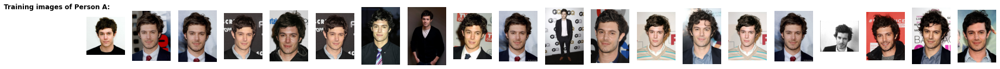

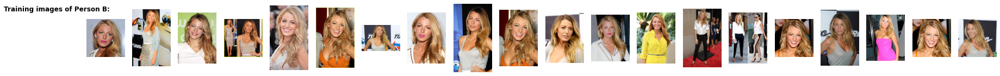

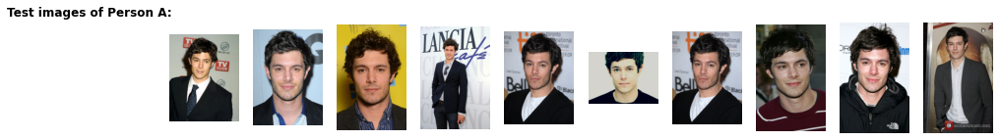

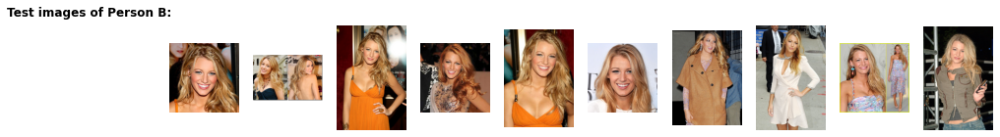

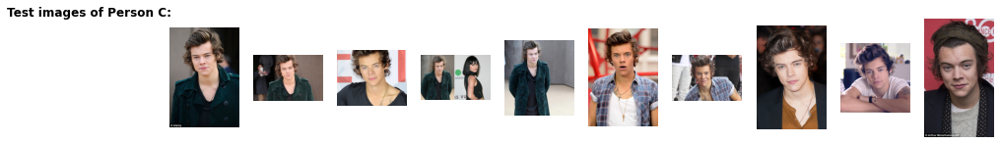

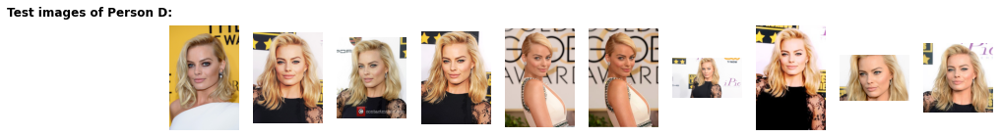

In [ ]:
#Plot all full images
f, axarr = plt.subplots(1,20,figsize=(30,30))
f.suptitle("Training images of Person A:", fontsize=12, fontweight="bold", x=0.1, y=0.53)
for i, figure in enumerate(training_images_person_A, start=0):
    axarr[i].imshow(cv2.cvtColor(figure, cv2.COLOR_BGR2RGB))
    axarr[i].axis('off')
plt.show

f, axarr = plt.subplots(1,20,figsize=(30,30))
f.suptitle("Training images of Person B:", fontweight="bold", fontsize=12, x=0.1, y=0.53)
for i, figure in enumerate(training_images_person_B, start=0):
    axarr[i].imshow(cv2.cvtColor(figure, cv2.COLOR_BGR2RGB))
    axarr[i].axis('off')
plt.show

f, axarr = plt.subplots(1,10,figsize=(15,15))
f.suptitle("Test images of Person A:", fontweight="bold", fontsize=12, x=0.05, y=0.57)
for i, figure in enumerate(test_images_person_A, start=0):
    axarr[i].imshow(cv2.cvtColor(figure, cv2.COLOR_BGR2RGB))
    axarr[i].axis('off')
plt.show

f, axarr = plt.subplots(1,10,figsize=(15,15))
f.suptitle("Test images of Person B:", fontweight="bold", fontsize=12, x=0.05, y=0.57)
for i, figure in enumerate(test_images_person_B, start=0):
    axarr[i].imshow(cv2.cvtColor(figure, cv2.COLOR_BGR2RGB))
    axarr[i].axis('off')
plt.show

f, axarr = plt.subplots(1,10,figsize=(15,15))
f.suptitle("Test images of Person C:", fontweight="bold", fontsize=12, x=0.05, y=0.57)
for i, figure in enumerate(test_images_person_C, start=0):
    axarr[i].imshow(cv2.cvtColor(figure, cv2.COLOR_BGR2RGB))
    axarr[i].axis('off')
plt.show

f, axarr = plt.subplots(1,10,figsize=(15,15))
f.suptitle("Test images of Person D:", fontweight="bold", fontsize=12, x=0.05, y=0.57)
for i, figure in enumerate(test_images_person_D, start=0):
    axarr[i].imshow(cv2.cvtColor(figure, cv2.COLOR_BGR2RGB))
    axarr[i].axis('off')
plt.show

**Now we show the complete dataset of extracted faces of all persons. Again, there is a split between training images and test images.**

<function matplotlib.pyplot.show>

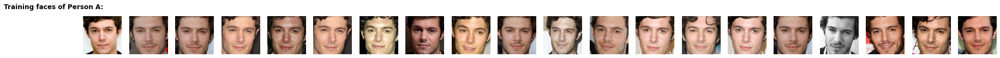

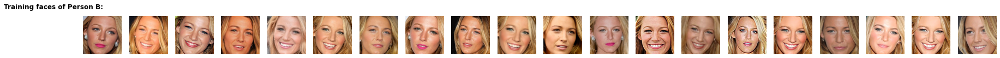

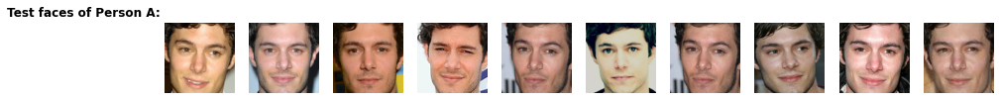

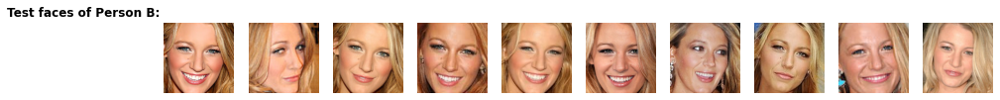

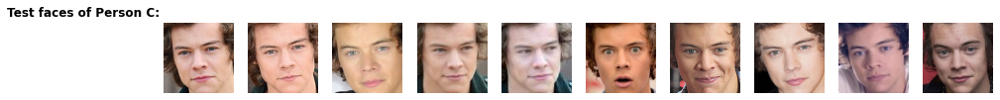

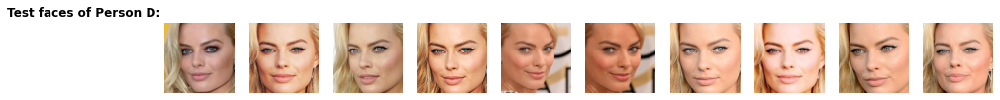

In [ ]:
#Plot all extracted faces:
f, axarr = plt.subplots(1,20,figsize=(30,30))
f.suptitle("Training faces of Person A:", fontsize=12, fontweight="bold", x=0.1, y=0.53)
for i, figure in enumerate(training_faces_person_A, start=0):
    axarr[i].imshow(cv2.cvtColor(figure, cv2.COLOR_BGR2RGB))
    axarr[i].axis('off')
plt.show

f, axarr = plt.subplots(1,20,figsize=(30,30))
f.suptitle("Training faces of Person B:", fontweight="bold", fontsize=12, x=0.1, y=0.53)
for i, figure in enumerate(training_faces_person_B, start=0):
    axarr[i].imshow(cv2.cvtColor(figure, cv2.COLOR_BGR2RGB))
    axarr[i].axis('off')
plt.show

f, axarr = plt.subplots(1,10,figsize=(15,15))
f.suptitle("Test faces of Person A:", fontweight="bold", fontsize=12, x=0.05, y=0.55)
for i, figure in enumerate(test_faces_person_A, start=0):
    axarr[i].imshow(cv2.cvtColor(figure, cv2.COLOR_BGR2RGB))
    axarr[i].axis('off')
plt.show

f, axarr = plt.subplots(1,10,figsize=(15,15))
f.suptitle("Test faces of Person B:", fontweight="bold", fontsize=12, x=0.05, y=0.55)
for i, figure in enumerate(test_faces_person_B, start=0):
    axarr[i].imshow(cv2.cvtColor(figure, cv2.COLOR_BGR2RGB))
    axarr[i].axis('off')
plt.show

f, axarr = plt.subplots(1,10,figsize=(15,15))
f.suptitle("Test faces of Person C:", fontweight="bold", fontsize=12, x=0.05, y=0.55)
for i, figure in enumerate(test_faces_person_C, start=0):
    axarr[i].imshow(cv2.cvtColor(figure, cv2.COLOR_BGR2RGB))
    axarr[i].axis('off')
plt.show

f, axarr = plt.subplots(1,10,figsize=(15,15))
f.suptitle("Test faces of Person D:", fontweight="bold", fontsize=12, x=0.05, y=0.55)
for i, figure in enumerate(test_faces_person_D, start=0):
    axarr[i].imshow(cv2.cvtColor(figure, cv2.COLOR_BGR2RGB))
    axarr[i].axis('off')
plt.show

# **2) Handcrafted Features - Histogram of Oriented Gradients (HOG)**


A feature descriptor is a representation of an image or an image patch that simplifies the image by extracting useful information and throwing away extraneous information. A robust and discriminative feature representation is key to perform automated object detection effectively. In this tutorial, we first handle a specific type of handcrafted feature representation, called 'Histogram of Oriented Gradients' or (HOG). (more info: https://www.learnopencv.com/histogram-of-oriented-gradients/)

In the HOG feature descriptor, the distribution (histograms) of directions of gradients (oriented gradients) are used as features. Gradients (x and y derivatives) of an image are useful because the magnitude of gradients is large around edges and corners (regions of abrupt intensity changes) and we know that edges and corners pack in a lot more information about object shape than flat regions.

The code below defines a function to calculate the HOG feature descriptor. In first instance, the input images need to be scaled to a fixed resolution and aspect ratio, 128 x 128 in this case. This way, the size of the output vector will be the same for all images, which allows to calculate the disctance between output vectors easily. 

In [ ]:
def handcrafted_feature_descriptor (face):
  #First resize the input image
  face_resized = cv2.resize(face, (128,128), interpolation = cv2.INTER_AREA)
  (H, hogImage) = feature.hog(face_resized, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), feature_vector=True, transform_sqrt=True, block_norm="L2", visualize=True)
  hogImage = exposure.rescale_intensity(hogImage, out_range=(0, 255))
  hogImage = hogImage.astype("uint8")
  return (H, hogImage)

As an example, the HOG feature descriptor is calculated for one image and visualized to get an impression of it. You can see that the output vector has size 8100, which is far less then the original image size of 300x300x3 or 270000.

The visualized output is enlarged because 128x128 is quite small to display. 

Size of input image:  (300, 300, 3)
Size of out HOG feature descriptor:  (8100,)
Feature descriptor:  [0.0088172  0.00872905 0.01111621 ... 0.00507021 0.03585265 0.10120185]


<function matplotlib.pyplot.show>

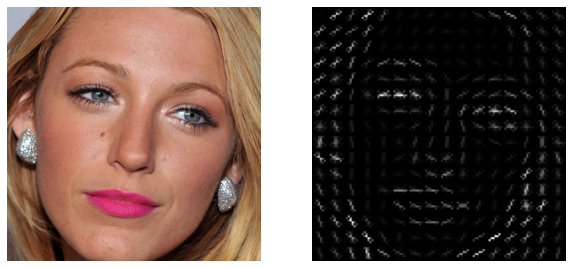

In [ ]:
#Example of HOG:
test_face = copy.deepcopy(training_faces_person_B[0])
print("Size of input image: ",np.shape(test_face))

feature1, hogImage1 = handcrafted_feature_descriptor(test_face)
print("Size of out HOG feature descriptor: ",np.shape(feature1))
print("Feature descriptor: ",feature1)

f2, axarr2 = plt.subplots(1,2,figsize=(10,10))
axarr2[0].imshow(cv2.cvtColor(test_face, cv2.COLOR_BGR2RGB))
axarr2[1].imshow(cv2.cvtColor(hogImage1, cv2.COLOR_BGR2RGB))
axarr2[0].axis('off')
axarr2[1].axis('off')
plt.show

The above visulized HOG output vector also shows how local the features describe the original image. You can clearly see the eyes, nose, mouth, ... In order to do this, the local direction of the the gradient is calculated. 

By way of example, we can see that if we resize the image to an absurd low resolution of 16x16, the HOG features do not mean anything anymore to us and it will be more difficult to compare HOG feature vectors of different images. 

<function matplotlib.pyplot.show>

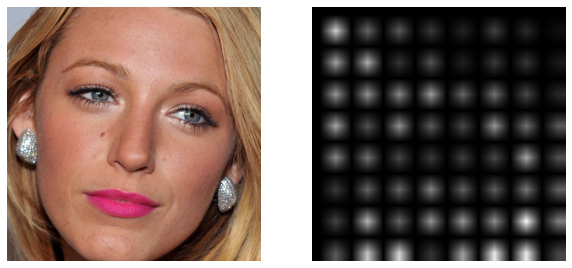

In [ ]:
# cv2_imshow(test_face)
face_resized_1 = cv2.resize(test_face, (16,16), interpolation = cv2.INTER_AREA)
(feature2, hogImage2) = feature.hog(face_resized_1, orientations=9, pixels_per_cell=(2, 2), cells_per_block=(4, 4), feature_vector=True, transform_sqrt=True, block_norm="L2", visualize=True)
hogImage2 = exposure.rescale_intensity(hogImage2, out_range=(0, 255))
hogImage2 = hogImage2.astype("uint8")
# cv2_imshow(cv2.resize(hogImage2, (300,300)))

f3, axarr3 = plt.subplots(1,2,figsize=(10,10))
axarr3[0].imshow(cv2.cvtColor(test_face, cv2.COLOR_BGR2RGB))
axarr3[1].imshow(cv2.cvtColor(cv2.resize(hogImage2, (300,300)), cv2.COLOR_BGR2RGB))
axarr3[0].axis('off')
axarr3[1].axis('off')
plt.show

Moreover, another advantage of HOG is that it is obviously based on
histogram of oriented gradient. It can not only describe the
feature of face contours, but is also invariant to photometric transformations, e.g. intensity variations. This is illustrated below where you can see that the features of a darker image are more or less the same as for the original image. It is clear that it will not be invariant to object rotations. 

(-0.5, 127.5, 127.5, -0.5)

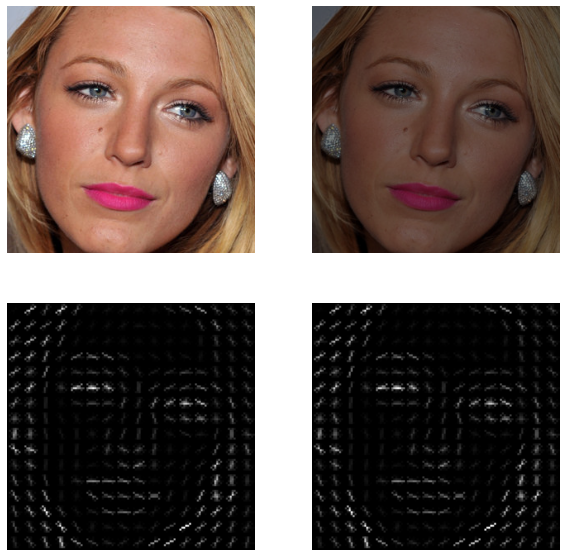

In [ ]:
test_face2 = cv2.cvtColor(test_face, cv2.COLOR_BGR2HSV)
test_face2[:,:,2] = np.multiply(test_face[:,:,2], 0.5, casting="unsafe")
test_face2 = np.array(test_face2,dtype="uint8")
test_face2 = cv2.cvtColor(test_face2, cv2.COLOR_HSV2BGR)
feature3, hogImage3 = handcrafted_feature_descriptor(test_face2)
f, axarr = plt.subplots(2,2,figsize=(10,10))
axarr[0,0].imshow(cv2.cvtColor(test_face, cv2.COLOR_BGR2RGB))
axarr[1,0].imshow(cv2.cvtColor(hogImage1, cv2.COLOR_BGR2RGB))
axarr[0,1].imshow(cv2.cvtColor(test_face2, cv2.COLOR_BGR2RGB))
axarr[1,1].imshow(cv2.cvtColor(hogImage3, cv2.COLOR_BGR2RGB))
axarr[0,0].axis('off')
axarr[1,0].axis('off')
axarr[0,1].axis('off')
axarr[1,1].axis('off')

To compare feature vectors of 2 input images, we can use the Euclidian disctance metric to describe their similarity, which we will the match score. The lower the match score, the more similarity between images. 

In [ ]:
def hog_distance(image1, image2):
  feature1, hogImage1 = handcrafted_feature_descriptor(image1)
  feature2, hogImage2 = handcrafted_feature_descriptor(image2)
  dist = distance.euclidean(feature1, feature2)
  return dist

The distance between same people should be less than between different people. The first image below is the image from which we start. We will calculate the match score between this image and all other persons. 

First, the trivial case is that the match score should be zero for the same image. Secondly, our intuition says that the match score should lower for other images of the same person compared to images of different persons. And finally, our intuition also says that images of person D are closer to images of person B than the other persons A and C do. 

We can see in the results that this is indeed the case. Importantly to note is that the match score between images of the same person is clearly lower then for the other persons. Of course this is a conclusion based on just a couple of cases, but you can check yourself that on average, this is the case for all other images as well. This shows that the HOG feature representation is discriminative in the sense that it can separate identical persons from different persons. 

Match score between identical images:  0.0


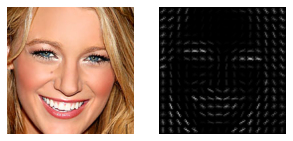

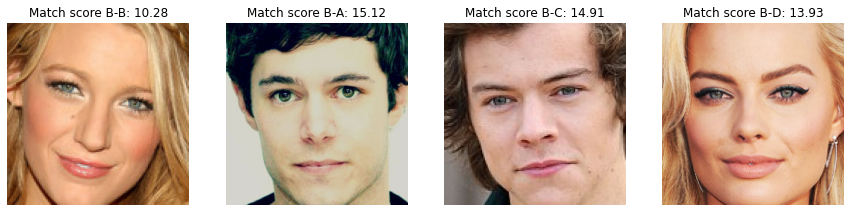

In [ ]:
test_face_B = copy.deepcopy(test_faces_person_B[0])
feature_B, hogImage_B = handcrafted_feature_descriptor(test_face_B)
distB = hog_distance(test_face_B, test_face_B)
print("Match score between identical images: ",distB)
f4, axarr4 = plt.subplots(1,2,figsize=(5,5))
axarr4[0].imshow(cv2.cvtColor(test_face_B, cv2.COLOR_BGR2RGB))
axarr4[1].imshow(cv2.cvtColor(cv2.resize(hogImage_B, (300,300)), cv2.COLOR_BGR2RGB))
axarr4[0].axis('off')
axarr4[1].axis('off')



test_face_B2 = copy.deepcopy(test_faces_person_B[2])
# featureB, hogImageB = handcrafted_feature_descriptor(test_face_B)
distB2 = hog_distance(test_face_B, test_face_B2)

test_face_A = copy.deepcopy(test_faces_person_A[5])
# featureA, hogImageA = handcrafted_feature_descriptor(test_face_A)
distA = hog_distance(test_face_B, test_face_A)

test_face_C = copy.deepcopy(test_faces_person_C[0])
# featureC, hogImageC = handcrafted_feature_descriptor(test_face_C)
distC = hog_distance(test_face_B, test_face_C)

test_face_D = copy.deepcopy(test_faces_person_D[1])
# featureD, hogImageD = handcrafted_feature_descriptor(test_face_D)
distD = hog_distance(test_face_B, test_face_D)

f5, axarr5 = plt.subplots(1,4,figsize=(15,15))
axarr5[0].imshow(cv2.cvtColor(test_face_B2, cv2.COLOR_BGR2RGB))
axarr5[1].imshow(cv2.cvtColor(test_face_A, cv2.COLOR_BGR2RGB))
axarr5[2].imshow(cv2.cvtColor(test_face_C, cv2.COLOR_BGR2RGB))
axarr5[3].imshow(cv2.cvtColor(test_face_D, cv2.COLOR_BGR2RGB))
axarr5[0].axis('off')
axarr5[1].axis('off')
axarr5[2].axis('off')
axarr5[3].axis('off')
axarr5[0].title.set_text('Match score B-B: '+str(round(distB2,2)))
axarr5[1].title.set_text('Match score B-A: '+str(round(distA,2)))
axarr5[2].title.set_text('Match score B-C: '+str(round(distC,2)))
axarr5[3].title.set_text('Match score B-D: '+str(round(distD,2)))

Finally, following function tries to detect a face in an input image using the HOG features. In order to do this, it slides over a part of the input image and calculates the distance between the HOG feature vectors of that part and that of an original example. When the distance is below a certain threshold, the function returns the original image with a rectangle around the detected face. 

In [ ]:
def sliding_window(image, patchsize, example, threshold, istep=2, jstep=2):
    image = copy.deepcopy(image)
    Ni = patchsize[0]
    Nj = patchsize[1]
    for i in range(0, image.shape[0] - Ni, istep):
        for j in range(0, image.shape[1] - Ni, jstep):
            patch = image[i:i + Ni, j:j + Nj,:]
            if hog_distance(example, patch) < threshold:
              image_return = cv2.rectangle(image, (i,j), (i+Ni, j+Nj), (0, 255, 0), 2) 
              return image_return
              break

First we test this with the face of the same image:

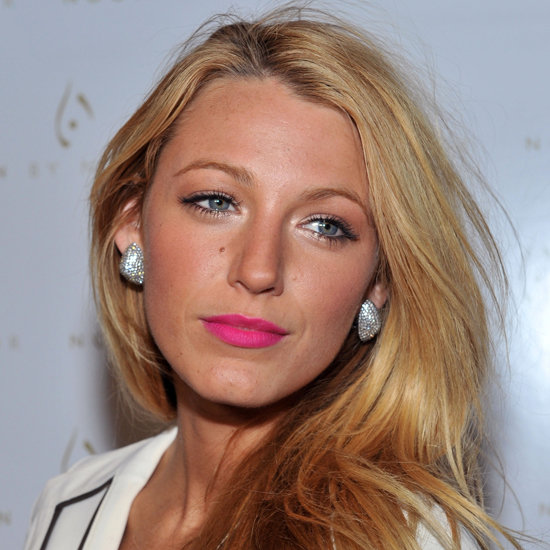

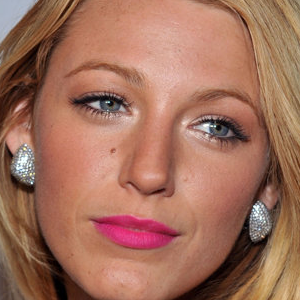

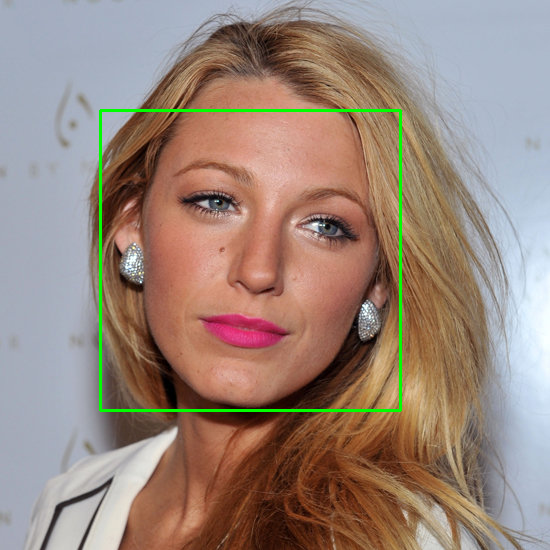

In [ ]:
test_image = training_images_person_B[0]
face = training_faces_person_B[0]
cv2_imshow(test_image)
cv2_imshow(face)
i = sliding_window(test_image, face.shape, face, 5, 10, 10)
cv2_imshow(i)

Now we can test if this can detect a face in a different image. In order to do this, the threshold needs to be tuned. (Wait 1 minute during run).

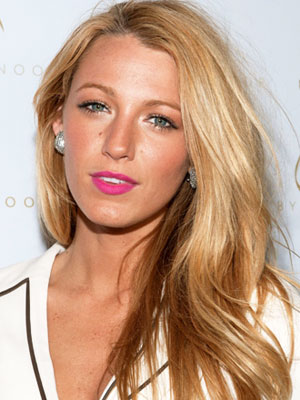

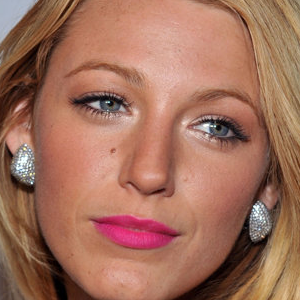

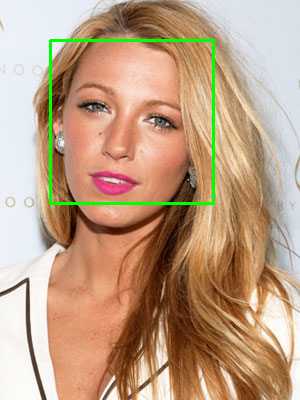

In [ ]:
test_image2 = training_images_person_B[7]
face = training_faces_person_B[0]
cv2_imshow(test_image2) 
cv2_imshow(face)
i = sliding_window(test_image2, training_faces_person_B[7].shape, face, 11, 5, 5)
cv2_imshow(i)

# **3) Learning Features from Data - Principal Component Analysis (PCA)**

To get a workable representation of the images we need to convert these to one-dimensional vectors of equal size. To do that, we resize the images to a reasonable middle ground and we flatten the images. Since PCA does not care about the visual nature of the data, it does not matter how we flatten the images (that is, if we enumerate the elements of the image matrices by row or by column), as long as we are consistent. Finally, as PCA requires, we scale the data to be in the (0, 1) range. With this, we take care of variance in illumination.


In [ ]:
from sklearn.preprocessing import MinMaxScaler
height = 200
width = 200

X_train = np.zeros((len(training_faces_person_A) + len(training_faces_person_B), height * width))
for i, person in enumerate(training_faces_person_A):
    X_train[i, :] = cv2.cvtColor(cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_CUBIC), cv2.COLOR_BGR2GRAY).flatten()
for i, person in enumerate(training_faces_person_B, start=len(training_faces_person_A)):
    X_train[i, :] = cv2.cvtColor(cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_CUBIC), cv2.COLOR_BGR2GRAY).flatten()

scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)

The idea behind PCA is to reduce the dimensionality of the dataset to some more meaningful vectors. These vectors are the eigenvalues of the correlation matrix of the data. To select the number of components for PCA, we can use the number of components that can explain the greatest amount of variance. In this case, we do the analysis to get enough components to explain 95% of the variance.

Number of components: 26


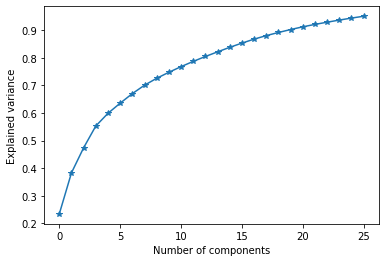

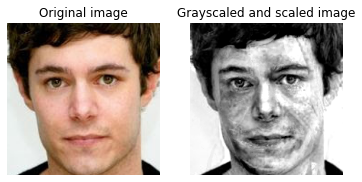

In [ ]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

explained_variance = 0.95
pca = PCA(n_components=explained_variance, whiten=True).fit(X_train)

print("Number of components: %s" % pca.components_.shape[0])
plt.plot(np.cumsum(pca.explained_variance_ratio_), "*-")
plt.xlabel("Number of components");
plt.ylabel("Explained variance");

fig, axes = plt.subplots(1, 2);
for ax in axes.flatten():
    ax.axis('off')
axes[0].imshow(training_faces_person_A[0][:, :, ::-1], cmap=plt.cm.gray);
axes[0].set_title("Original image")
axes[1].imshow(X_train[0].reshape((width, height)), cmap=plt.cm.gray);
axes[1].set_title("Grayscaled and scaled image");

As we can see, with 26 components we can explain 95% of the variance of the data, giving a huge reduction comparing with the 200 * 200 = 40000 components of the original data.

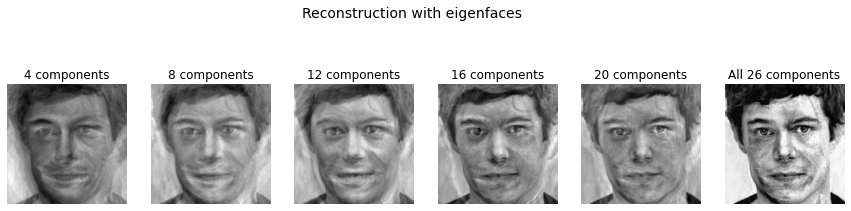

In [ ]:
vectors_pca = pca.transform(X_train)

n_reconstructions = 5
fig, axes = plt.subplots(1, n_reconstructions + 1, figsize=(15, 4))
fig.suptitle("Reconstruction with eigenfaces", fontsize=14)
for ax in axes.flatten():
    ax.axis('off')
for i, ax in enumerate(axes[:-1], start=1):
    recomposition = np.dot(vectors_pca[:, :(i * 4)], pca.components_[:(i * 4), :])[0, :]
    ax.imshow(recomposition.reshape((height, width)), cmap=plt.cm.gray)
    ax.set_title("%s components" % (i * 4))

axes[-1].imshow(pca.inverse_transform(vectors_pca[0]).reshape(height, width), cmap=plt.cm.gray);
axes[-1].set_title("All %s components" % (pca.components_.shape[0]));

We can also see the error induced from the dimensionality reduction.


In [ ]:
X_reconstructed = pca.inverse_transform(vectors_pca)
mse = ((X_train - X_reconstructed) ** 2).mean()
print("Mean square error: %s" % mse)

Mean square error: 0.0030690058916753183


We can see how separable is the reduced data by plotting the projections of the images on the two first components of the analysis.

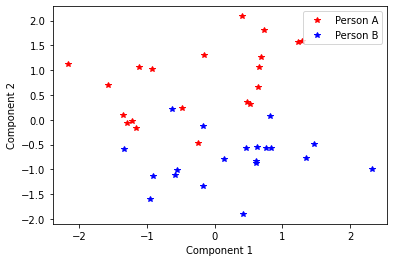

In [ ]:
plt.plot(vectors_pca[:20, 0], vectors_pca[:20, 1], "r*", label="Person A") 
plt.plot(vectors_pca[20:, 0], vectors_pca[20:, 1], "b*", label="Person B");
plt.legend()
plt.xlabel("Component 1")
plt.ylabel("Component 2");

In [ ]:
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

def imscatter(data, images, ax, zoom=0.2):
    for datum, image in zip(data, images):
        im = OffsetImage(image, cmap=plt.cm.gray, zoom=zoom)
        ab = AnnotationBbox(im, datum, xycoords='data', frameon=False)
        ax.add_artist(ab)
    ax.update_datalim(data)
    ax.autoscale()

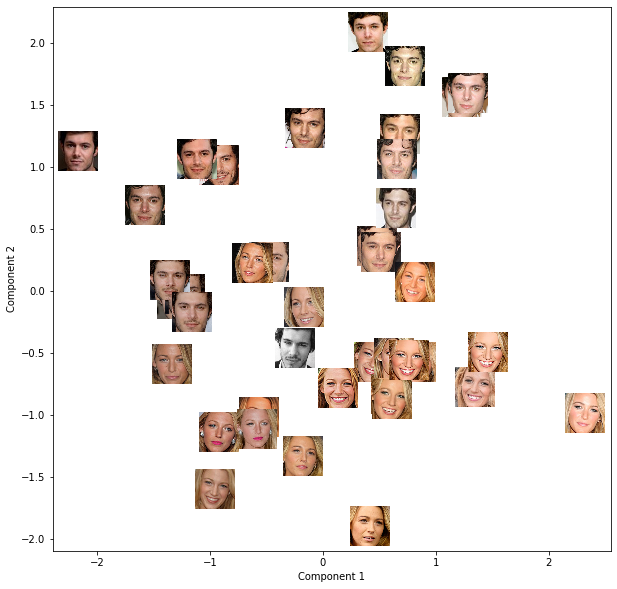

In [ ]:
non_scaled_images = scaler.inverse_transform(X_train)

fig, ax = plt.subplots(figsize=(10, 10))

imscatter(vectors_pca[:, :2], [cv2.cvtColor(cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_CUBIC), cv2.COLOR_BGR2RGB) for person in np.concatenate((training_faces_person_A, training_faces_person_B))], ax)
plt.xlabel("Component 1")
plt.ylabel("Component 2");

# **4) Learning Features from Data - Convolutional Neural Network (CNN)**

We use the VGG Face descriptor, from a pre-trained neural network, to get an image vectorization. For this to work, the only preprocessing needed is to have the images resized to a common size. We use the same dimensions as used in the previous section.


In [ ]:
from keras.engine import  Model
from keras.layers import Input
from keras_vggface.vggface import VGGFace
import tensorflow as tf

vgg_features = VGGFace(include_top=False, input_shape=(height, width, 3), pooling='avg')

X_train = np.zeros((len(training_faces_person_A) + len(training_faces_person_B), width, height, 3))

for i, person in enumerate(training_faces_person_A):
    X_train[i] = cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_CUBIC)
for i, person in enumerate(training_faces_person_B, start=len(training_faces_person_A)):
    X_train[i] = cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_CUBIC)

vectors_vgg = vgg_features.predict(X_train)

Using TensorFlow backend.
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:519: FutureWarn


58916864/58909280 [==============================] - 2s 0us/step



We can visualize the high-dimensional vectors built by the network, by using the t-SNE method, which can give us and idea of how separable they are.

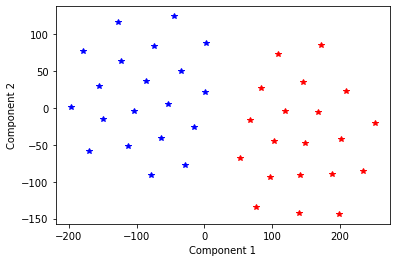

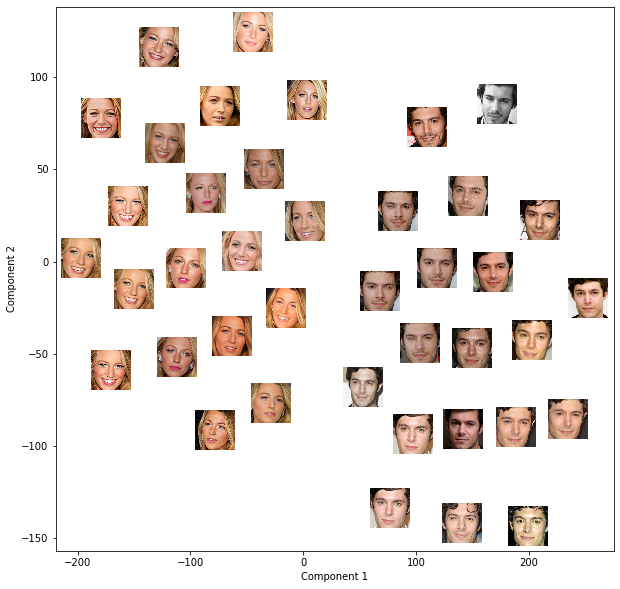

In [ ]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, random_state=42)
tsne_results = tsne.fit_transform(vectors_vgg)
plt.plot(tsne_results[:20, 0], tsne_results[:20, 1], "r*")
plt.plot(tsne_results[20:, 0], tsne_results[20:, 1], "b*")
plt.xlabel("Component 1")
plt.ylabel("Component 2")

fig, ax = plt.subplots(figsize=(10, 10))

imscatter(tsne_results, [cv2.cvtColor(cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_CUBIC), cv2.COLOR_BGR2RGB) for person in np.concatenate((training_faces_person_A, training_faces_person_B))], ax)
plt.xlabel("Component 1")
plt.ylabel("Component 2");

Quite separable.


# **5) Exploit Feature Representations**

# **5.1) Classification using HOG**

A classic approach to face classification is HOG-SVM, which stands for Histogram of Oriented Gradients and Support Vector Machines, respectively. To inititate our pre-processing pipeline, we will first resize all images in both the training set and the test set. Resizing an image needs a way to calculate pixel values for the new image from the original one. For our purposes, resampling using pixel area relation seems to be the way to go.
 

In [ ]:
import numpy as np 
from matplotlib import pyplot as plt
from skimage import color
from skimage.feature import hog
from sklearn import svm
from sklearn.metrics import classification_report,accuracy_score
from sklearn.svm import LinearSVC
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import AdaBoostClassifier

height = 128
width = 128

X_train = np.zeros((len(training_faces_person_A) + len(training_faces_person_B), width , height, 3))
y_train = np.zeros(len(training_faces_person_A) + len(training_faces_person_B))
X_test = np.zeros((len(test_faces_person_A) + len(test_faces_person_B), width, height, 3))
y_test = np.zeros(len(test_faces_person_A) + len(test_faces_person_B))

for i, person in enumerate(training_faces_person_A):
    y_train[i] = int(0)
    X_train[i] = cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_AREA)
for i, person in enumerate(training_faces_person_B, start=len(training_faces_person_A)):
    y_train[i] = int(1)
    X_train[i] = cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_AREA)

for i, person in enumerate(test_faces_person_A):
    y_test[i] = int(0)
    X_test[i] = cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_AREA)
for i, person in enumerate(test_faces_person_B, start=len(test_faces_person_A)):
    y_test[i] = int(1)
    X_test[i] = cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_AREA)

We can say the hog features are compressed and coded version of the pictures created via cells and blocks structures. They give us information about luminosity densities and orientations of them for each pixel. We can observe local shape changes with this way. The hog feature vector is generated by combining the gradient calculation for each pixel, the creation of a histogram for each block wtih these gradients, calculating the normalization of the histograms, and collecting the normalization vectors together for each block. When calculating our HOG we will perform a transformation as a part of our pipeline. We will convert colour images to grayscale, calculate their HOGs and finally re-scale the data.

In [ ]:
X_train_gray = [color.rgb2gray(i) for i in X_train]
X_test_gray = [color.rgb2gray(i) for i in X_test]

ppc = 16
hog_images = []
hog_features = []
for image in X_train_gray:
    fd,hog_image = hog(image, orientations=10, pixels_per_cell=(ppc,ppc),cells_per_block=(8, 8),feature_vector=True, transform_sqrt=True, block_norm= 'L2',visualize=True)
    hog_image = exposure.rescale_intensity(hog_image, out_range=(0, 255))
    hog_image = hog_image.astype("uint8")
    hog_images.append(hog_image)
    hog_features.append(fd)

hog_images_test = []
hog_features_test = []
for image in X_test_gray:
    fd_test,hog_image_test = hog(image, orientations=10, pixels_per_cell=(ppc,ppc),cells_per_block=(8, 8),feature_vector=True, transform_sqrt=True, block_norm= 'L2',visualize=True)
    hog_image_test = exposure.rescale_intensity(hog_image_test, out_range=(0, 255))
    hog_image_test = hog_image_test.astype("uint8")
    hog_images_test.append(hog_image_test)
    hog_features_test.append(fd_test)


The next step is to train a classifier. In this analysis Support Vector Machines (SVM) will be used to train a model to classify if an image contains person of Class A or Class B. SVM classifiers are generally used for linearly separable classes. The working logic is very simple. It tries to determine the best hyperplane between the classes to seperate them. Although deep learning approaches have proven there superiority in similar image recognition/classification problem, given the small size of the data set it is interesting to find out how a traditional computer vision approach performs in a situation like this. We will use Stochastic Gradient Descent (SGD), because it works reasonably well and is fast. The classifier we will use here is just a Linear SVM classifier with SGD training which means that it implements a regularized linear SVM model with stochastic gradient descent (SGD) learning. Similar to SVC with parameter kernel=’linear’, but implemented in terms of liblinear rather than libsvm, so it has more flexibility in the choice of penalties and loss functions. The gradient of the loss is estimated each sample at a time and the model is updated along the way with a decreasing strength schedule (aka learning rate).  The model it fits can be controlled with the loss parameter and it fits a linear support vector machine (SVM). The regularizer is a penalty added to the loss function that shrinks model parameters towards the zero vector using the squared euclidean norm L2 in this case. The loss parameter is set to 'squared_hinge' which gives a linear SVM but is quadratically penalized. 

In [ ]:
from sklearn.linear_model import SGDClassifier
clf = GridSearchCV(LinearSVC(), {'C': [1.0, 2.0, 4.0, 8.0]})
clf = SGDClassifier(random_state=42, tol=1e-3, loss='squared_hinge', penalty='l2', 
                    alpha=0.0001, l1_ratio=0.15, fit_intercept=True, max_iter=1000, 
                    shuffle=True, verbose=0, epsilon=0.1, n_jobs=None,learning_rate='optimal',
                    eta0=0.0, power_t=0.5, early_stopping=False, validation_fraction=0.1, 
                    n_iter_no_change=5, class_weight=None, warm_start=False, average=False)

clf.fit(hog_features,y_train)

SGDClassifier(alpha=0.0001, average=False, class_weight=None,
              early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
              l1_ratio=0.15, learning_rate='optimal', loss='squared_hinge',
              max_iter=1000, n_iter_no_change=5, n_jobs=None, penalty='l2',
              power_t=0.5, random_state=42, shuffle=True, tol=0.001,
              validation_fraction=0.1, verbose=0, warm_start=False)

We then test the classifier using the test set containing images of Person A and Person B. We use the confusion matrix to calculate the accuracy. We finally display the images in the test set with the corresponding predicted class and true class. Since accuracy isn’t the most specific kind of metric to judge a classifier's performance, we see precision, recall, f1-score, and support as well. The support is simply the number of times this ground truth label occurred in our test set. The F1-Score is actually just computed from the precision and recall scores. Precision and recall are more specific measures than a single accuracy score. A higher value for both is better. 

Accuracy: 1.0


              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        10
         1.0       1.00      1.00      1.00        10

    accuracy                           1.00        20
   macro avg       1.00      1.00      1.00        20
weighted avg       1.00      1.00      1.00        20

Accuracy :  100.0 %


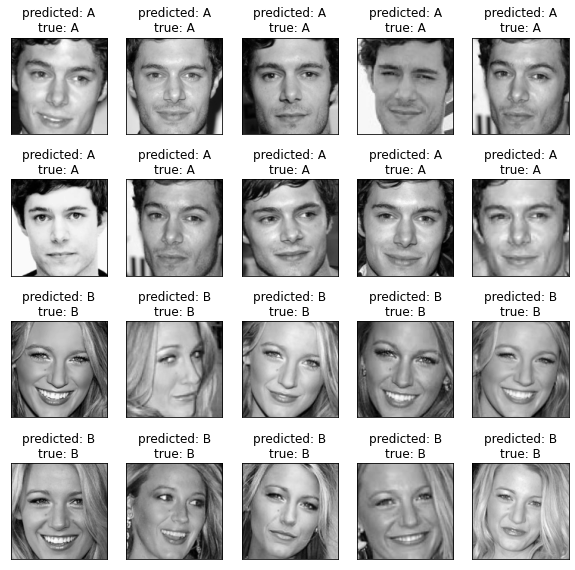

In [ ]:
y_pred = clf.predict(hog_features_test)
#print(clf.best_params_)
#print(hog_features)


print("Accuracy: "+str(accuracy_score(y_test, y_pred)))
print('\n')
print(classification_report(y_test, y_pred))

labels = [0,1]
def accuracy(confusion_matrix):
   diagonal_sum = confusion_matrix.trace()
   sum_of_all_elements = confusion_matrix.sum()
   return diagonal_sum / sum_of_all_elements
cm=confusion_matrix(y_test, y_pred, labels=labels)
print("Accuracy : ", accuracy(cm)*100, "%")
target_names = ['Person A', 'Person B']

# Visualization
def plot_gallery(images, tit, h, w, rows=4, cols=5):
    plt.figure(figsize = (10,10))
    for i in range(rows * cols):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(images[i].reshape((128, 128)), cmap=plt.cm.gray)
        plt.title(tit[i])
        plt.xticks(())
        plt.yticks(())
 
def titles(y_pred, y_test, target_names):
    for i in range(y_pred.shape[0]):
        pred_name = target_names[int(y_pred[i])].split(' ')[-1]
        true_name = target_names[int(y_test[i])].split(' ')[-1]
        yield 'predicted: {0}\ntrue: {1}'.format(pred_name, true_name)
 
prediction_titles = list(titles(y_pred, y_test, target_names))
plot_gallery(X_test_gray, prediction_titles, height, width)

A perfect accuracy is obtained on our validation set which should give us some confidence of a better than average performance on unseen test set. We use the same pipeline to perform the preprocessing of the test images of person C and person D. Let's apply the classifier to predict classes of test images of Person C and Person D.  


Accuracy: 0.7


              precision    recall  f1-score   support

         0.0       0.62      1.00      0.77        10
         1.0       1.00      0.40      0.57        10

    accuracy                           0.70        20
   macro avg       0.81      0.70      0.67        20
weighted avg       0.81      0.70      0.67        20

Accuracy :  70.0 %


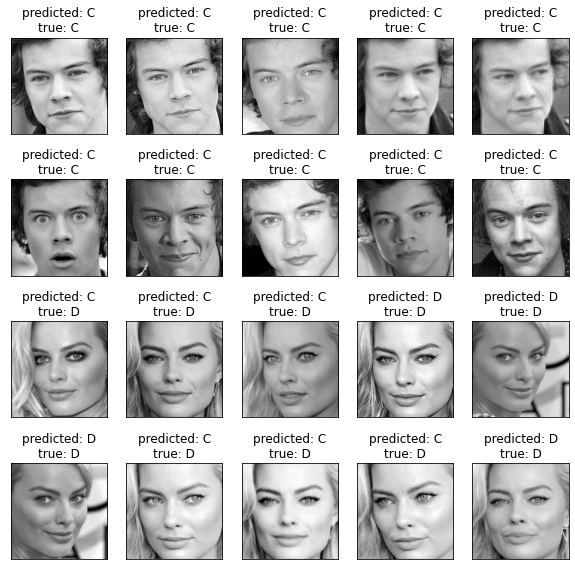

In [ ]:
X_test = np.zeros((len(test_faces_person_C) + len(test_faces_person_D), width, height, 3))
y_test = np.zeros(len(test_faces_person_C) + len(test_faces_person_D))

for i, person in enumerate(test_faces_person_C):
    y_test[i] = int(0)
    X_test[i] = cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_AREA)
for i, person in enumerate(test_faces_person_D, start=len(test_faces_person_C)):
    y_test[i] = int(1)
    X_test[i] = cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_AREA)
X_test_gray = [ color.rgb2gray(i) for i in X_test]

hog_images_test = []
hog_features_test = []
for image in X_test_gray:
    fd_test,hog_image_test = hog(image, orientations=10, pixels_per_cell=(ppc,ppc),cells_per_block=(8, 8),feature_vector=True, transform_sqrt=True, block_norm= 'L2',visualize=True)
    hog_image_test = exposure.rescale_intensity(hog_image_test, out_range=(0, 255))
    hog_image_test = hog_image_test.astype("uint8")
    hog_images_test.append(hog_image_test)
    hog_features_test.append(fd_test)

y_pred = clf.predict(hog_features_test)
#print(clf.kneighbors(X=hog_features_test, n_neighbors=1, return_distance=True))
#print(y_pred)

print("Accuracy: "+str(accuracy_score(y_test, y_pred)))
print('\n')
print(classification_report(y_test, y_pred))

cm=confusion_matrix(y_test, y_pred, labels=labels)
print("Accuracy : ", accuracy(cm)*100, "%")

# Visualization

target_names = ['Person C', 'Person D'] 
prediction_titles = list(titles(y_pred, y_test, target_names))
plot_gallery(X_test_gray, prediction_titles, height, width)

The accuracy measured isn't too bad as compared to the accuracy one might obtain with a Linear SVC or a traditional SVM classifier. But we will work on improving the accuracy in one of the later sections using a different classifier. Linear  Support  Vector  Machines  trained  on  HOG features are now a de facto standard across many visual perception tasks. HOG features can be viewed as an affine weighting on the margin of a quadratic kernel SVM. Underlying  this  prior  and  added  capacity  is  the preservation of local pixel interactions and second-order statistics, and using these  foundational  components  alone, we can see that it is possible  to learn a descently performing classifier, with no further assumptions on images,edges or filters. Preserving local second-order interactions combined with  large  amounts  of training data, it is possible to learn a classifier that performs well on a Binary Face Classification task and that achieves a better accuracy than what we obtained. 

# **5.2) Classification using PCA**

We’re going to discuss a popular technique for face classification called eigenfaces. And at the heart of eigenfaces is an unsupervised dimensionality reduction technique called principal component analysis (PCA), and we will see how we can apply this general technique to our specific task of face classification. 
A naïve way of accomplishing this is to take the new image, flatten it into a vector, and compute the Euclidean distance between it and all of the other flattened images in our database. But it will be very slow and prone to high error rate amongst several other downsides.
We want a system that is both fast and accurate.  For this, we’ll use a neural network! We can train our network on our dataset and use it for our face classification task.
To inititate our pre-processing pipeline, we will first resize all images in both the training set and the test set. Resizing an image needs a way to calculate pixel values for the new image from the original one. For our purposes, a bicubic interpolation over 4×4 pixel neighborhood seems to be the way to go. We will convert colour images (training and validation (AB) test sets) to grayscale and collapse each into one dimension. As the final step in our preprocessing pipeline, we will scale and translate each feature individually such that it is in the given range on the training set, e.g. between zero and one.
 

In [ ]:
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
from sklearn.datasets import fetch_lfw_people
from sklearn.metrics import classification_report
from sklearn.decomposition import PCA
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import confusion_matrix

height = 200
width = 200

X_train1 = np.zeros((len(training_faces_person_A) + len(training_faces_person_B), height * width))
y_train = np.zeros(len(training_faces_person_A) + len(training_faces_person_B))
for i, person in enumerate(training_faces_person_A):
    y_train[i] = int(0)
    X_train1[i, :] = cv2.cvtColor(cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_CUBIC), cv2.COLOR_BGR2GRAY).flatten()
for i, person in enumerate(training_faces_person_B, start=len(training_faces_person_A)):
    y_train[i] = int(1)
    X_train1[i, :] = cv2.cvtColor(cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_CUBIC), cv2.COLOR_BGR2GRAY).flatten()

scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train1)

X_test1 = np.zeros((len(test_faces_person_A) + len(test_faces_person_B), height * width))
y_test = np.zeros(len(test_faces_person_A) + len(test_faces_person_B))
for i, person in enumerate(test_faces_person_A):
    y_test[i] = int(0)
    X_test1[i, :] = cv2.cvtColor(cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_CUBIC), cv2.COLOR_BGR2GRAY).flatten()
for i, person in enumerate(test_faces_person_B, start=len(test_faces_person_A)):
    y_test[i] = int(1)
    X_test1[i, :] = cv2.cvtColor(cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_CUBIC), cv2.COLOR_BGR2GRAY).flatten()

scaler = MinMaxScaler()
X_test = scaler.fit_transform(X_test1)

Dealing high dimentionality is also one of the many reasons why we don’t use the naïve method. Instead, we’d like to take our high-dimensional images and boil them down to a smaller dimensionality while retaining the essence or important parts of the image. All dimensionality reduction techniques aim to find some hyperplane, a higher-dimensional line, to project the points onto. We won’t worry about the exact math behind this since scikit-learn can apply this projection for us. Our technique of dimensionality reduction is called principal component analysis (PCA). The idea behind PCA is that we want to select the hyperplane such that when all the points are projected onto it, they are maximally spread out. In other words, we want the axis of maximal variance!  But how do we figure out this axis? we compute the covariance matrix of our data and consider that covariance matrix’s largest eigenvectors. Using this approach, we can take high-dimensional data and reduce it down to a lower dimension by selecting the largest eigenvectors of the covariance matrix and projecting onto those eigenvectors. It’s easier for our classifier to separate faces when our data are spread out as opposed to bunched together.

*** But how does this relate to our challenge of face classification?*** We can conceptualize our m.n images as points in m.n-dimensional space. Then, we can use PCA to reduce our space from m.n into something much smaller. This will help speed up our computations and be robust to noise and variation. Now we can simply use scikit-learn’s PCA class to perform the dimensionality reduction for us! We have to select the number of components, i.e., the output dimensionality (the number of eigenvectors to project onto), that we want to reduce down to, and we have to tweak this parameter to try to get the best result! We’ll use 95 components. Additionally, we’ll whiten our data as Whitening just makes our resulting data have a unit variance, which has been shown to produce better results.

In [ ]:
target_names = ['Person A', 'Person B']
explained_variance = 0.95
pca = PCA(n_components=explained_variance, whiten=True).fit(X_train)
X_train_pca = pca.transform(X_train)
X_test_pca = pca.transform(X_test)

Now that we have a reduced-dimensionality vector, we can train our neural network! 
Let’s discuss why early stopping parameter is important. Essentially, our optimizer will monitor the average accuracy for the validation set for each epoch. If it notices that our validation accuracy hasn’t increased significantly for a certain number of epochs, then we stop training. This is a regularization technique that prevents our model from overfitting! 
Finally, we can make a prediction of the test image set containing images pf Person A and Person B, and use a function to print out an entire report of quality for each class. Again, Accuracy isn’t the most specific kind of metric to begin. Instead, we use precision, recall, f1-score, and support. We use a 3 layered Multi Layered Perceptron with a rectified linear unit function as it's activation function for the hidden layer. This model optimizes the log-loss function using LBFGS. LBFGS is an optimizer in the family of quasi-Newton methods and converges faster and performs better on smaller datasets like the one we are using.

Fitting the classifier to the training set
              precision    recall  f1-score   support

    Person A       1.00      1.00      1.00        10
    Person B       1.00      1.00      1.00        10

    accuracy                           1.00        20
   macro avg       1.00      1.00      1.00        20
weighted avg       1.00      1.00      1.00        20

Accuracy :  100.0 %


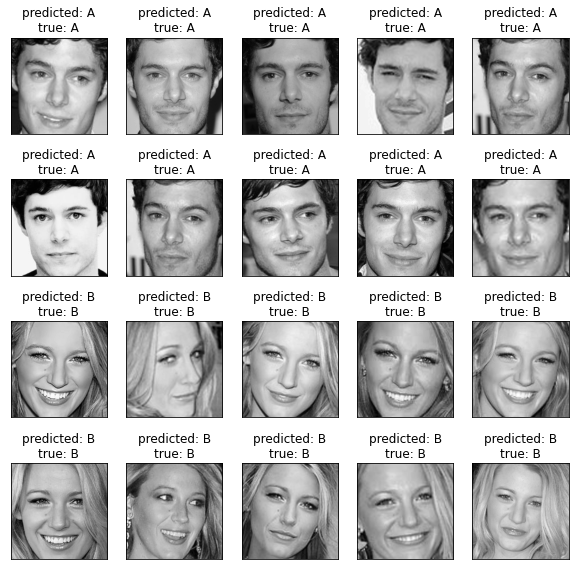

In [ ]:
print("Fitting the classifier to the training set")
clf = MLPClassifier(hidden_layer_sizes=(1000, 500, 50), solver = 'lbfgs', activation = 'relu', batch_size=15, verbose=True, early_stopping=True).fit(X_train_pca, y_train)
y_pred = clf.predict(X_test_pca)
print(classification_report(y_test, y_pred,target_names=target_names))

def accuracy(confusion_matrix):
   diagonal_sum = confusion_matrix.trace()
   sum_of_all_elements = confusion_matrix.sum()
   return diagonal_sum / sum_of_all_elements
cm = confusion_matrix(y_pred, y_test)
print("Accuracy : ", accuracy(cm)*100, "%")

# Visualization
def plot_gallery(images, tit, h, w, rows=4, cols=5):
    plt.figure(figsize = (10,10))
    for i in range(rows * cols):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(images[i].reshape((height, width)), cmap=plt.cm.gray)
        plt.title(tit[i])
        plt.xticks(())
        plt.yticks(())
 
def titles(y_pred, y_test, target_names):
    for i in range(y_pred.shape[0]):
        pred_name = target_names[int(y_pred[i])].split(' ')[-1]
        true_name = target_names[int(y_test[i])].split(' ')[-1]
        yield 'predicted: {0}\ntrue: {1}'.format(pred_name, true_name)
 
prediction_titles = list(titles(y_pred, y_test, target_names))
plot_gallery(X_test1, prediction_titles, height, width)

After training our classifier and obtaining perfect accuracy on our validation test set(AB), we can feed it a few unseen test images(CD) to classify. We will let the same preprocessing pipeline handle the refining of our test set. Now let's deploy the model to predict test images of person C and D! As always, we can compute the confusion matrix to calculate the accuracy and print our network’s predictions and the ground truth value for each test image.

              precision    recall  f1-score   support

    Person C       1.00      0.60      0.75        10
    Person D       0.71      1.00      0.83        10

    accuracy                           0.80        20
   macro avg       0.86      0.80      0.79        20
weighted avg       0.86      0.80      0.79        20

Accuracy :  80.0 %


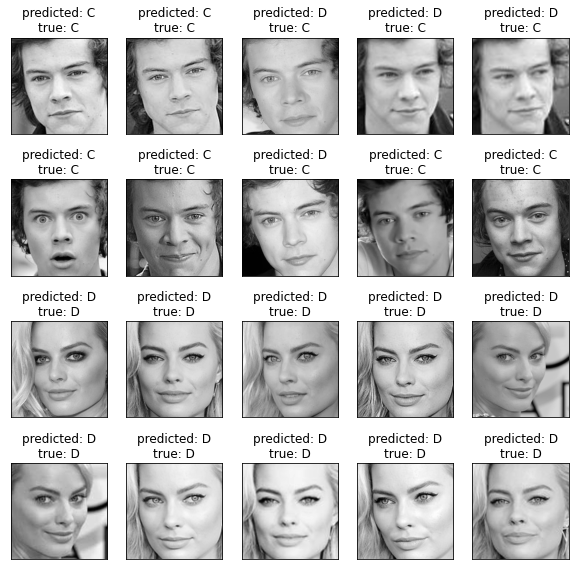

In [ ]:
Z_test1 = np.zeros((len(test_faces_person_C) + len(test_faces_person_D), height * width))
z_test = np.zeros(len(test_faces_person_C) + len(test_faces_person_D))
for i, person in enumerate(test_faces_person_C):
    z_test[i] = int(0)
    Z_test1[i, :] = cv2.cvtColor(cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_CUBIC), cv2.COLOR_BGR2GRAY).flatten()
for i, person in enumerate(test_faces_person_D, start=len(test_faces_person_C)):
    z_test[i] = int(1)
    Z_test1[i, :] = cv2.cvtColor(cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_CUBIC), cv2.COLOR_BGR2GRAY).flatten()

scaler = MinMaxScaler()
target_names = ['Person C', 'Person D']
Z_test = scaler.fit_transform(Z_test1)
Z_test_pca = pca.transform(Z_test)

z_pred = clf.predict(Z_test_pca)
print(classification_report(z_test, z_pred, target_names=target_names))

def accuracy(confusion_matrix):
   diagonal_sum = confusion_matrix.trace()
   sum_of_all_elements = confusion_matrix.sum()
   return diagonal_sum / sum_of_all_elements
cm = confusion_matrix(z_pred, z_test)
print("Accuracy : ", accuracy(cm)*100, "%")

# Visualization
def plot_gallery(images, tit, h, w, rows=4, cols=5):
    plt.figure(figsize = (10,10))
    for i in range(rows * cols):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(images[i].reshape((height, width)), cmap=plt.cm.gray)
        plt.title(tit[i])
        plt.xticks(())
        plt.yticks(())
 
def titles(z_pred, z_test, target_names):
    for i in range(z_pred.shape[0]):
        pred_name = target_names[int(z_pred[i])].split(' ')[-1]
        true_name = target_names[int(z_test[i])].split(' ')[-1]
        yield 'predicted: {0}\ntrue: {1}'.format(pred_name, true_name)
 
prediction_titles = list(titles(z_pred, z_test, target_names))
plot_gallery(Z_test1, prediction_titles, height, width)

We used PCA to reduce the dimensionality of images into something smaller. Now that we have a smaller representation of our faces, we applied a Multi Layered Perceptron classifier that takes the reduced-dimension input and produces a class label. MLP is similar to logistic regression with multiple layers. The neural network is committing less misclassification in both classes. The accuracy of 85%-95% means that the classifier has 85%-95% chance of correctly classifying a new unseen example. For classification problems, it is a not bad result at all. Dimensionality Reduction plays a really important role, especially when we are working with thousands of features. Principal Components Analysis is one of the top dimensionality reduction algorithms and this technique, in addition to making the work of feature manipulation easier, it still helps to improve the results of the MLP classifier.

# **5.3) Classification using CNN**

We will learn to use a face recognition algorithm based on SVM combined with VGG network model extracting facial features, which can not only accurately extract face features, but also reduce feature dimensions and avoid irrelevant features to participate in the calculation.

Convolutional neural networks are now capable of outperforming humans on some computer vision tasks, such as classifying face images. They require a lot of data and time to train. However, sometimes the dataset may be limited and not enough to train a CNN from scratch. In such a scenerio it is helpful to use a pre-trained CNN, which has been trained on a large dataset. We will use VGG  pre-trained CNN. We will use it as a feature extractor instead of a classifier. The last layer of the CNN can be removed and an image can be passed through the rest of the network to obtain its feature vector. After extracting features from all the training images, a classfier like SVM will be trained for image classification.

Transfer learning is a popular method in computer vision because it allows us to build accurate models in a timesaving way. With transfer learning, instead of starting the learning process from scratch, you start from patterns that have been learned when solving a different problem. This way you leverage previous learnings and avoid starting from scratch.
 To inititate our pre-processing pipeline, we will first resize all images in both the training set and the test set. Resizing an image needs a way to calculate pixel values for the new image from the original one. For our purposes, a bicubic interpolation over 4×4 pixel neighborhood seems to be the way to go. 

In [ ]:
import os
import sklearn
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.svm import SVC
from sklearn.externals import joblib
from keras.engine import  Model
from keras.layers import Input
from keras_vggface.vggface import VGGFace
import tensorflow as tf

height = 200
width = 200

X_train = np.zeros((len(training_faces_person_A) + len(training_faces_person_B), width , height, 3))
y_train = np.zeros(len(training_faces_person_A) + len(training_faces_person_B))
X_test = np.zeros((len(test_faces_person_A) + len(test_faces_person_B), width, height, 3))
y_test = np.zeros(len(test_faces_person_A) + len(test_faces_person_B))

for i, person in enumerate(training_faces_person_A):
    y_train[i] = int(0)
    X_train[i] = cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_CUBIC)
for i, person in enumerate(training_faces_person_B, start=len(training_faces_person_A)):
    y_train[i] = int(1)
    X_train[i] = cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_CUBIC)

for i, person in enumerate(test_faces_person_A):
    y_test[i] = int(0)
    X_test[i] = cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_CUBIC)
for i, person in enumerate(test_faces_person_B, start=len(test_faces_person_A)):
    y_test[i] = int(1)
    X_test[i] = cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_CUBIC)

/usr/local/lib/python3.6/dist-packages/sklearn/externals/joblib/__init__.py:15: FutureWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=FutureWarning)


VGG has 2 parts. We will be using only one of them, namely, the Convolutional base, which is composed by a stack of convolutional and pooling layers. The main goal of the convolutional base is to generate features from the image. The VGGFace() class takes a few arguments that interests us as we are looking to use the model for our own task, ie. for transfer learning. We set include_top to False to not include the output layers for the model as we are fitting the model on our own problem. A model without a top will output activations from the last convolutional or pooling layer directly. We use average pooling while  training a new set of output layers. A pooling layer is a new layer added after the convolutional layer. The pooling layer operates upon each feature map separately to create a new set of the same number of pooled feature maps. Average pooling calculates the average value for each patch on the feature map.

 Transfer learning has the benefit of decreasing the training time for a neural network model and can result in lower generalization error.  Here, the output of the model from a layer prior to the output layer of the model is used as input to our SVM classifier model. The feature that feeds into the last classification layer is also called the bottleneck feature. The learned feature will be feed into the fully connected layer for classification.

In [ ]:
vgg_features = VGGFace(include_top=False, input_shape=(height, width, 3), pooling='avg')
vectors_vgg_train = vgg_features.predict(X_train)
vectors_vgg_test = vgg_features.predict(X_test)

The last few layers of the VGG model are fully connected layers prior to the output layer. These layers will provide a complex set of features to describe a given face image and will provide useful input when training a our SVM classifier which will classify the test images based on the features extracted by the convolutional base. These features will feed the classifier that we want to train so that we can identify if faces in test images belong to Person A or Person B. In this classification task, we will train a SVM classifier, and hope that the trained classifier can tell us a correct label when we feed it an unseen feature vector. 

The goal of the SVM is to find a hyper-plane that separates the training data correctly in two half-spaces while maximising the margin between those two classes. We must be aware that the SVM classifier has two hyperparameters. These hyperparameters are the penalty parameter C of the error term, and the gamma if the Rbf kernal is used. Although SVM is a linear classifier, which could only deal with linear separable data sets, we will apply a kernel trick to make it work for non-linear separable case. To optimize the choice of these hyperparameters, we will use exhaustive grid search with 10-fold cross validation. 

When training an SVM with the Radial Basis Function (RBF) kernel, two parameters must be considered: C and gamma. The parameter C, common to all SVM kernels, trades off misclassification of training examples against simplicity of the decision surface. A low C makes the decision surface smooth, while a high C aims at classifying all training examples correctly. gamma defines how much influence a single training example has. The larger gamma is, the closer other examples must be to be affected.

Fitting 10 folds for each of 20 candidates, totalling 200 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    2.9s finished



Best parameters set:
{'C': 1, 'kernel': 'linear'}

Classification report:
              precision    recall  f1-score   support

    Person A       1.00      1.00      1.00        10
    Person B       1.00      1.00      1.00        10

    accuracy                           1.00        20
   macro avg       1.00      1.00      1.00        20
weighted avg       1.00      1.00      1.00        20

Accuracy :  100.0 %


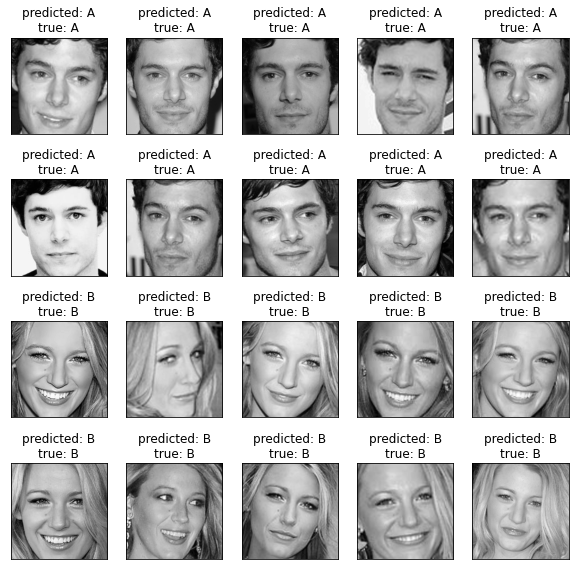

In [ ]:
param = [
    {
        "kernel": ["linear"],
        "C": [1, 10, 100, 1000]
    },
    {
        "kernel": ["rbf"],
        "C": [1, 10, 100, 1000],
        "gamma": [1e-2, 1e-3, 1e-4, 1e-5]
    }
]
 
# request probability estimation
svm = SVC(probability=True)

# 10-fold cross validation, use 4 thread as each fold and each parameter set can be train in parallel
clf = GridSearchCV(svm, param,
      cv=10, n_jobs=4, verbose=3)
 
clf.fit(vectors_vgg_train, y_train)
''' 
if os.path.exists(model_output_path):
    joblib.dump(clf.best_estimator_, model_output_path)
else:
    print("Cannot save trained svm model to {0}.".format(model_output_path))
    '''
 
print("\nBest parameters set:")
print(clf.best_params_)
 
y_predict=clf.predict(vectors_vgg_test)
labels = [0, 1]
labels=sorted(list(set(labels)))
#print("\nConfusion matrix:")
#print("Labels: {0}\n".format(",".join(labels)))
 
print("\nClassification report:")
target_names = ['Person A', 'Person B']
print(classification_report(y_test, y_predict, target_names=target_names))

def accuracy(confusion_matrix):
   diagonal_sum = confusion_matrix.trace()
   sum_of_all_elements = confusion_matrix.sum()
   return diagonal_sum / sum_of_all_elements
cm=confusion_matrix(y_test, y_predict, labels=labels)
print("Accuracy : ", accuracy(cm)*100, "%")

# Visualization
def plot_gallery(images, tit, h, w, rows=4, cols=5):
    plt.figure(figsize = (10,10))
    for i in range(rows * cols):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(images[i].reshape((200, 200)), cmap=plt.cm.gray)
        plt.title(tit[i])
        plt.xticks(())
        plt.yticks(())
 
def titles(y_predict, y_test, target_names):
    for i in range(y_predict.shape[0]):
        pred_name = target_names[int(y_predict[i])].split(' ')[-1]
        true_name = target_names[int(y_test[i])].split(' ')[-1]
        yield 'predicted: {0}\ntrue: {1}'.format(pred_name, true_name)
 
prediction_titles = list(titles(y_predict, y_test, target_names))
plot_gallery(X_test1, prediction_titles, height, width)


The training accuracy result we get, is a  perfect result! Though this might be due to overfitting. Let's see how the classifiers performs on unseen test images. Let's apply the same technique to assign classes to Test sets of Person C and Person D!


Classification report:
              precision    recall  f1-score   support

    Person C       1.00      1.00      1.00        10
    Person D       1.00      1.00      1.00        10

    accuracy                           1.00        20
   macro avg       1.00      1.00      1.00        20
weighted avg       1.00      1.00      1.00        20

Accuracy :  100.0 %


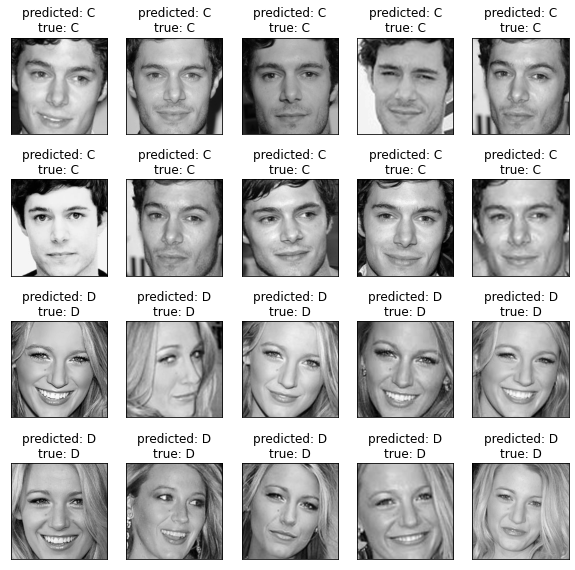

In [ ]:
Z_test = np.zeros((len(test_faces_person_C) + len(test_faces_person_D), width , height, 3))
z_test = np.zeros(len(test_faces_person_C) + len(test_faces_person_D))

for i, person in enumerate(test_faces_person_C):
    z_test[i] = int(0)
    Z_test[i] = cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_CUBIC)
for i, person in enumerate(test_faces_person_D, start=len(test_faces_person_C)):
    z_test[i] = int(1)
    Z_test[i] = cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_CUBIC)

vectors_vgg_test_CD = vgg_features.predict(Z_test)
z_predict=clf.predict(vectors_vgg_test_CD)

labels = [0, 1]
labels=sorted(list(set(labels)))
#print("\nConfusion matrix:")
 
print("\nClassification report:")
target_names = ['Person C', 'Person D']
print(classification_report(z_test, z_predict, target_names=target_names))

def accuracy(confusion_matrix):
   diagonal_sum = confusion_matrix.trace()
   sum_of_all_elements = confusion_matrix.sum()
   return diagonal_sum / sum_of_all_elements
cm=confusion_matrix(z_predict, z_test, labels=labels)
print("Accuracy : ", accuracy(cm)*100, "%")

# Visualization
def plot_gallery(images, tit, h, w, rows=4, cols=5):
    plt.figure(figsize = (10,10))
    for i in range(rows * cols):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(images[i].reshape((200, 200)), cmap=plt.cm.gray)
        plt.title(tit[i])
        plt.xticks(())
        plt.yticks(())
 
def titles(z_predict, z_test, target_names):
    for i in range(y_predict.shape[0]):
        pred_name = target_names[int(z_predict[i])].split(' ')[-1]
        true_name = target_names[int(z_test[i])].split(' ')[-1]
        yield 'predicted: {0}\ntrue: {1}'.format(pred_name, true_name)
 
prediction_titles = list(titles(z_predict, z_test, target_names))
plot_gallery(X_test1, prediction_titles, height, width)


Convolutional layers closer to the input layer of the model learn low-level features such as lines, that layers in the middle of the layer learn complex abstract features that combine the lower level features extracted from the input, and layers closer to the output interpret the extracted features in the context of our classification task.

But you may ask, why did we use SVM? 

First, keep in mind our feature extractor is a CNN. CNN’s are non-linear models capable of learning non-linear features — we are assuming that the features learned by the CNN are already robust and discriminative.
The second, and perhaps arguably more important reason, is that our feature vectors tend to be very large and have high dimensionality. We, therefore, need a fast model that can be trained on top of the features — SVM models tend to be very fast to train.

 According to Tang (2013), we were supposed to obtain brilliant classification accuracy by training a SVM classifier on the features extracted by the convolutional base, and we did end up obtaining maximal accuracy or the Person CD test set as expected. Since the classifier can work with unseen images quite perfectly, it seems that the over-fitting issue is not so serious afterall.

# **5.4) Identification using HOG**

In the Identification sections, we will compute the feature representations the same way we did earlier in the Classification sections along with all the pre-processing steps respective to the feature representation used. We will then feed the feature vectors into a Knn Classifier and tune it's parameters to obtain a desirable result for each of the feature representations we have implemented so far. We will additionally list the three closest training images for each image in the test set, using a distance metric.  

In [ ]:
import numpy as np 
from matplotlib import pyplot as plt
from skimage import color
from skimage.feature import hog
from sklearn import svm
from sklearn.metrics import classification_report,accuracy_score
from sklearn.svm import LinearSVC
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier

height = 128
width = 128

X_train = np.zeros((len(training_faces_person_A) + len(training_faces_person_B), width , height, 3))
y_train = np.zeros(len(training_faces_person_A) + len(training_faces_person_B))
X_test = np.zeros((len(test_faces_person_A) + len(test_faces_person_B), width, height, 3))
y_test = np.zeros(len(test_faces_person_A) + len(test_faces_person_B))

for i, person in enumerate(training_faces_person_A):
    y_train[i] = int(0)
    X_train[i] = cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_AREA)
for i, person in enumerate(training_faces_person_B, start=len(training_faces_person_A)):
    y_train[i] = int(1)
    X_train[i] = cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_AREA)
X_train_gray = [ color.rgb2gray(i) for i in X_train]

for i, person in enumerate(test_faces_person_A):
    y_test[i] = int(0)
    X_test[i] = cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_AREA)
for i, person in enumerate(test_faces_person_B, start=len(test_faces_person_A)):
    y_test[i] = int(1)
    X_test[i] = cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_AREA)
X_test_gray = [ color.rgb2gray(i) for i in X_test]

ppc = 16
hog_images = []
hog_features = []
for image in X_train_gray:
    fd,hog_image = hog(image, orientations=16, pixels_per_cell=(ppc,ppc),cells_per_block=(4, 4),feature_vector=True, transform_sqrt=True, block_norm= 'L2',visualize=True)
    hog_image = exposure.rescale_intensity(hog_image, out_range=(0, 255))
    hog_image = hog_image.astype("uint8")
    hog_images.append(hog_image)
    hog_features.append(fd)

hog_images_test = []
hog_features_test = []
for image in X_test_gray:
    fd_test,hog_image_test = hog(image, orientations=16, pixels_per_cell=(ppc,ppc),cells_per_block=(4, 4),feature_vector=True, transform_sqrt=True, block_norm= 'L2',visualize=True)
    hog_image_test = exposure.rescale_intensity(hog_image_test, out_range=(0, 255))
    hog_image_test = hog_image_test.astype("uint8")
    hog_images_test.append(hog_image_test)
    hog_features_test.append(fd_test)

Neighbors-based classification is a type of instance-based learning or non-generalizing learning: it does not attempt to construct a general internal model, but simply stores instances of the training data. Classification is computed from a simple majority vote of the nearest neighbors of each point: a query point is assigned the data class which has the most representatives within the nearest neighbors of the point. 

The k-nearest neighbor classifier is a type of “lazy learning” algorithm where nothing is actually “learned”. Instead, the k-Nearest Neighbor (k-NN) training phase simply accepts a set of feature vectors and labels and stores them — that’s it! Then, when it is time to classify a new feature vector, it accepts the feature vector, computes the distance to all stored feature vectors (normally using the Euclidean distance, but any distance metric or similarity metric can be used), sorts them by distance, and returns the top k “neighbors” to the input feature vector. From there, each of the k neighbors vote as to what they think the label of the classification is.

* KNeighborsClassifier implements learning based on the 
nearest neighbors of each query point, where K is an integer value specified by us. 
* The optimal choice of the value of K is highly data-dependent: in general a larger suppresses the effects of noise, but makes the classification boundaries less distinct. We will treat K as a hyper-parameter and tune it used a Grid Search technique which will perform an exhaustive search over the K parameter for our classifier using a (Stratified) 10 Fold Cross Validation method.
* Weights = 'distance' assigns weights proportional to the inverse of the distance from the query point which means that closer neighbors of a query point will have a greater influence than neighbors which are further away. 
* Setting algorithm parameter to 'auto' will attempt to decide the most appropriate algorithm for itself, which in this case does not really have an effect on the classification. 
* The leaf size affects the speed of the construction and query, as well as the memory required to store the tree. We will set this to 50 which you can modify based on trial-and-error method or by using a hypertuner. 
* The distance metric we will use is the minkowski metric, and with p=2 is equivalent to the standard Euclidean metric.
* Once the Grid Search algorithm identifies the optimal value for parameter K, it will refit our Knn Classifier using the best found K on the whole training dataset.

Fitting 10 folds for each of 36 candidates, totalling 360 fits


[Parallel(n_jobs=5)]: Using backend LokyBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done  22 tasks      | elapsed:    1.0s
[Parallel(n_jobs=5)]: Done 118 tasks      | elapsed:    3.3s
[Parallel(n_jobs=5)]: Done 278 tasks      | elapsed:    6.9s
[Parallel(n_jobs=5)]: Done 360 out of 360 | elapsed:    8.8s finished


{'n_neighbors': 3}
Accuracy: 1.0


              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        10
         1.0       1.00      1.00      1.00        10

    accuracy                           1.00        20
   macro avg       1.00      1.00      1.00        20
weighted avg       1.00      1.00      1.00        20

Accuracy :  100.0 %


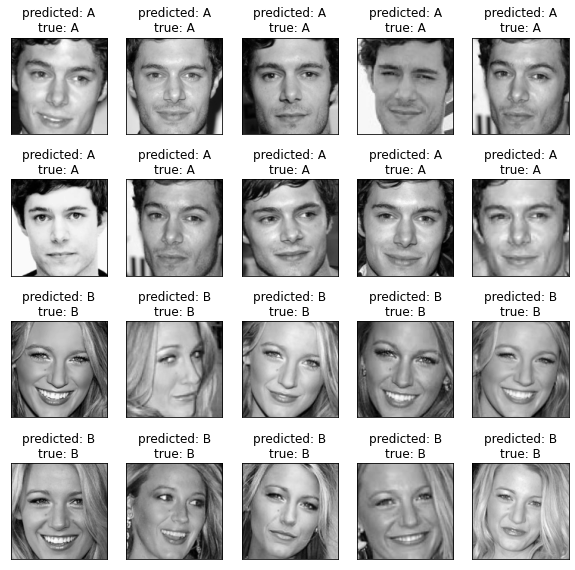

In [ ]:
knn = KNeighborsClassifier( weights='distance', algorithm='auto', leaf_size=50, p=2, metric='minkowski', metric_params=None, n_jobs=5)
knn.fit(hog_features,y_train)
param = {"n_neighbors" :  np.arange(1, 37)}
clf = GridSearchCV(knn, param, refit=True,
      cv=10, n_jobs=5, verbose=3)
clf.fit(hog_features,y_train)
y_pred = clf.predict(hog_features_test)
print(clf.best_params_)
#print(hog_features)
neigh = knn.kneighbors(X=hog_features_test, n_neighbors=3, return_distance=False)
#print(neigh[0][0])

print("Accuracy: "+str(accuracy_score(y_test, y_pred)))
print('\n')
print(classification_report(y_test, y_pred))

labels = [0,1]
def accuracy(confusion_matrix):
   diagonal_sum = confusion_matrix.trace()
   sum_of_all_elements = confusion_matrix.sum()
   return diagonal_sum / sum_of_all_elements
cm=confusion_matrix(y_test, y_pred, labels=labels)
print("Accuracy : ", accuracy(cm)*100, "%")

# Visualization
def plot_gallery(images, tit, h, w, rows=4, cols=5):
    plt.figure(figsize = (10,10))
    for i in range(rows * cols):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(images[i].reshape((128, 128)), cmap=plt.cm.gray)
        plt.title(tit[i])
        plt.xticks(())
        plt.yticks(())
 
def titles(y_predict, y_test, target_names):
    for i in range(y_predict.shape[0]):
        pred_name = target_names[int(y_predict[i])].split(' ')[-1]
        true_name = target_names[int(y_test[i])].split(' ')[-1]
        yield 'predicted: {0}\ntrue: {1}'.format(pred_name, true_name)
target_names = ['Person A', 'Person B'] 
prediction_titles = list(titles(y_pred, y_test, target_names))
plot_gallery(X_test_gray, prediction_titles, height, width
             )


We obtain a 100% accuracy on the test set containing images of Person A and Person B. Also, note the optimal value of K found after exhaustive search, displayed right above the accuracy. Now, for each test image, lets observe the three closest images in the training set. 

Test Image    |              Closest Training Images                  


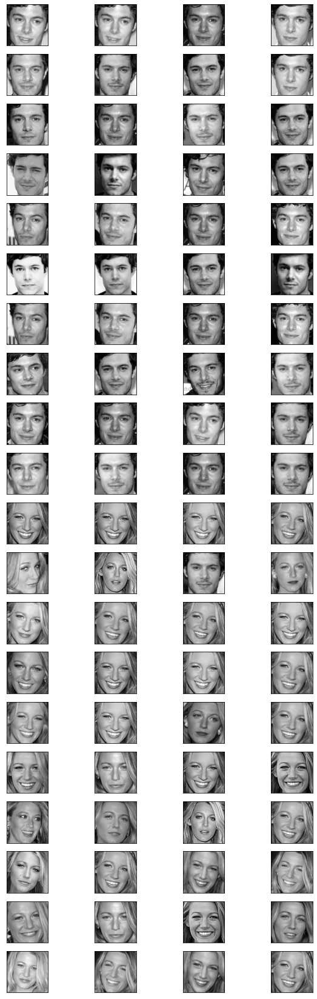

In [ ]:
print("Test Image    |              Closest Training Images                  ")
def plot( rows=20, cols=4):
    plt.figure(figsize = (10,30))
    c = 0
    count = 0
    for i in range(rows * cols):
        plt.subplot(rows, cols, i + 1)
        if (i%4 == 0):
          plt.imshow(X_test_gray[c].reshape((128, 128)), cmap=plt.cm.gray)
          plt.xticks(())
          plt.yticks(())
          c = c + 1
        else:
          plt.imshow(X_train_gray[neigh[c-1][count]].reshape((128, 128)), cmap=plt.cm.gray)
          plt.xticks(())
          plt.yticks(())
          count = count + 1
          if count > 2:
            count = 0
plot()

We will test the classifier by subjecting it to classify images in the test set containing images of Person C and Person D.

Accuracy: 0.6


              precision    recall  f1-score   support

         0.0       0.56      1.00      0.71        10
         1.0       1.00      0.20      0.33        10

    accuracy                           0.60        20
   macro avg       0.78      0.60      0.52        20
weighted avg       0.78      0.60      0.52        20

Accuracy :  60.0 %


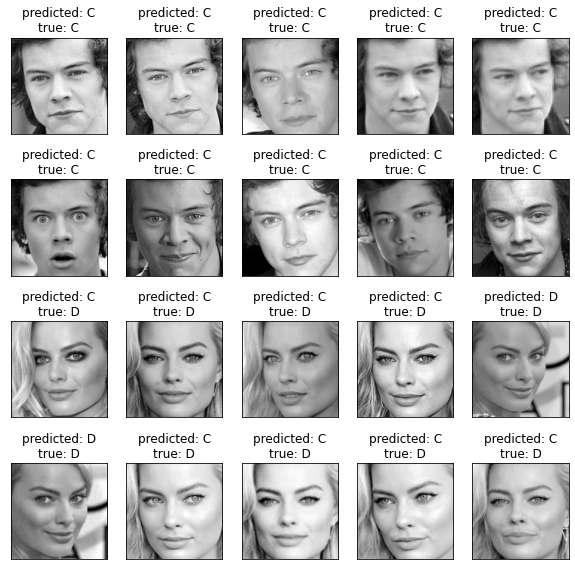

In [ ]:
X_test = np.zeros((len(test_faces_person_C) + len(test_faces_person_D), width, height, 3))
y_test = np.zeros(len(test_faces_person_C) + len(test_faces_person_D))

for i, person in enumerate(test_faces_person_C):
    y_test[i] = int(0)
    X_test[i] = cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_AREA)
for i, person in enumerate(test_faces_person_D, start=len(test_faces_person_C)):
    y_test[i] = int(1)
    X_test[i] = cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_AREA)
X_test_gray = [ color.rgb2gray(i) for i in X_test]

hog_images_test = []
hog_features_test = []
for image in X_test_gray:
    fd_test,hog_image_test = hog(image, orientations=16, pixels_per_cell=(ppc,ppc),cells_per_block=(4, 4),feature_vector=True, transform_sqrt=True, block_norm= 'L2',visualize=True)
    hog_image_test = exposure.rescale_intensity(hog_image_test, out_range=(0, 255))
    hog_image_test = hog_image_test.astype("uint8")
    hog_images_test.append(hog_image_test)
    hog_features_test.append(fd_test)

y_pred = clf.predict(hog_features_test)
#print(clf.kneighbors(X=hog_features_test, n_neighbors=1, return_distance=True))
#print(y_pred)

print("Accuracy: "+str(accuracy_score(y_test, y_pred)))
print('\n')
print(classification_report(y_test, y_pred))

cm=confusion_matrix(y_test, y_pred, labels=labels)
print("Accuracy : ", accuracy(cm)*100, "%")

neigh = knn.kneighbors(X=hog_features_test, n_neighbors=3, return_distance=False)

# Visualization

target_names = ['Person C', 'Person D'] 
prediction_titles = list(titles(y_pred, y_test, target_names))
plot_gallery(X_test_gray, prediction_titles, height, width)

We obtain a 60% accuracy on the test set containing images of Person C and Person D, which isn't a surprise. Now, for each test image, lets observe the three closest images in the training set. 

Test Image    |              Closest Training Images                  


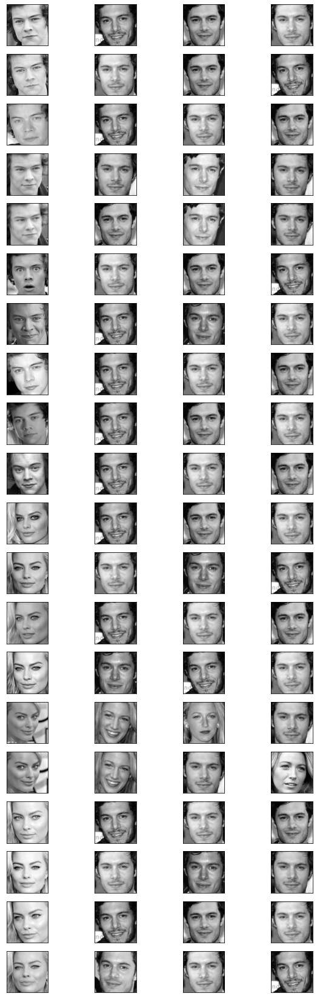

In [ ]:
print("Test Image    |              Closest Training Images                  ")
def plot( rows=20, cols=4):
    plt.figure(figsize = (10,30))
    c = 0
    count = 0
    for i in range(rows * cols):
        plt.subplot(rows, cols, i + 1)
        if (i%4 == 0):
          plt.imshow(X_test_gray[c].reshape((128, 128)), cmap=plt.cm.gray)
          plt.xticks(())
          plt.yticks(())
          c = c + 1
        else:
          plt.imshow(X_train_gray[neigh[c-1][count]].reshape((128, 128)), cmap=plt.cm.gray)
          plt.xticks(())
          plt.yticks(())
          count = count + 1
          if count > 2:
            count = 0
plot()

# **5.5) Identification using PCA**

* KNeighborsClassifier implements learning based on the 
nearest neighbors of each query point, where K is an integer value specified by us. 
* The optimal choice of the value of K is highly data-dependent: in general a larger suppresses the effects of noise, but makes the classification boundaries less distinct. We will treat K as a hyper-parameter and tune it used a Grid Search technique which will perform an exhaustive search over the K parameter for our classifier using a (Stratified) 10 Fold Cross Validation method.
* We will use uniform weights: that is, the value assigned to a query point is computed from a simple majority vote of the nearest neighbors.  All points in each neighborhood are weighted equally.
* Setting algorithm parameter to 'kd_tree' will attempt to use the KDTree algorithm to compute the nearest neighbors.
* The leaf size affects the speed of the construction and query, as well as the memory required to store the tree. We will set this to 100 which you can modify based on trial-and-error method or by using a hypertuner. 
* The distance metric we will use is the minkowski metric, and with p=2 is equivalent to the standard Euclidean metric.
* The n_jobs parameter specifies the number of parallel jobs to run for neighbors search. -1 means using all processors.
* Once the Grid Search algorithm identifies the optimal value for parameter K, it will refit our Knn Classifier using the best found K on the whole training dataset.

Fitting 10 folds for each of 36 candidates, totalling 360 fits


[Parallel(n_jobs=5)]: Using backend LokyBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done  34 tasks      | elapsed:    0.9s
[Parallel(n_jobs=5)]: Done 226 tasks      | elapsed:    4.9s
[Parallel(n_jobs=5)]: Done 360 out of 360 | elapsed:    7.6s finished


{'n_neighbors': 1}
Accuracy: 0.95


              precision    recall  f1-score   support

         0.0       1.00      0.90      0.95        10
         1.0       0.91      1.00      0.95        10

    accuracy                           0.95        20
   macro avg       0.95      0.95      0.95        20
weighted avg       0.95      0.95      0.95        20

Accuracy :  95.0 %


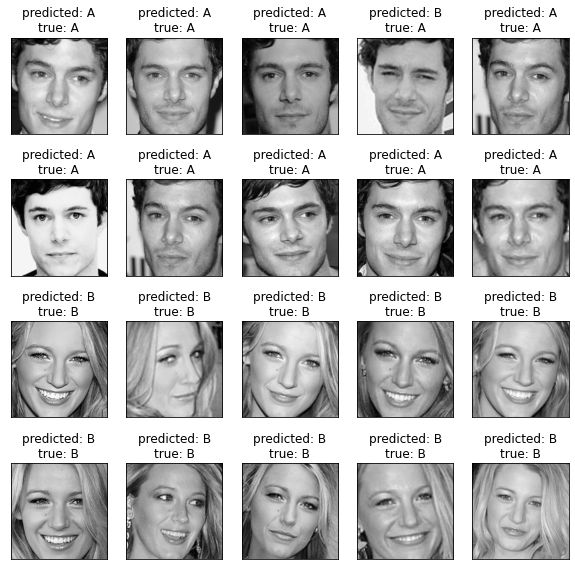

In [ ]:
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
from sklearn.datasets import fetch_lfw_people
from sklearn.metrics import classification_report
from sklearn.decomposition import PCA
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import confusion_matrix

height = 200
width = 200

X_train1 = np.zeros((len(training_faces_person_A) + len(training_faces_person_B), height * width))
y_train = np.zeros(len(training_faces_person_A) + len(training_faces_person_B))
for i, person in enumerate(training_faces_person_A):
    y_train[i] = int(0)
    X_train1[i, :] = cv2.cvtColor(cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_CUBIC), cv2.COLOR_BGR2GRAY).flatten()
for i, person in enumerate(training_faces_person_B, start=len(training_faces_person_A)):
    y_train[i] = int(1)
    X_train1[i, :] = cv2.cvtColor(cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_CUBIC), cv2.COLOR_BGR2GRAY).flatten()

scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train1)

X_test1 = np.zeros((len(test_faces_person_A) + len(test_faces_person_B), height * width))
y_test = np.zeros(len(test_faces_person_A) + len(test_faces_person_B))
for i, person in enumerate(test_faces_person_A):
    y_test[i] = int(0)
    X_test1[i, :] = cv2.cvtColor(cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_CUBIC), cv2.COLOR_BGR2GRAY).flatten()
for i, person in enumerate(test_faces_person_B, start=len(test_faces_person_A)):
    y_test[i] = int(1)
    X_test1[i, :] = cv2.cvtColor(cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_CUBIC), cv2.COLOR_BGR2GRAY).flatten()

scaler = MinMaxScaler()
X_test = scaler.fit_transform(X_test1)

target_names = ['Person A', 'Person B']
explained_variance = 0.95
pca = PCA(n_components=explained_variance, whiten=True).fit(X_train)
X_train_pca = pca.transform(X_train)
X_test_pca = pca.transform(X_test)

#Weights = Distance | p=1 is better on CD test
knn = KNeighborsClassifier( weights='uniform', algorithm='kd_tree', leaf_size=100, p=2, metric='minkowski', metric_params=None, n_jobs=-1)
knn.fit(X_train_pca,y_train)
param = {"n_neighbors" :  np.arange(1, 37)}
clf = GridSearchCV(knn, param,refit=True,
      cv=10, n_jobs=5, verbose=3)
clf.fit(X_train_pca,y_train)
y_pred = clf.predict(X_test_pca)
print(clf.best_params_)
#print(hog_features)
neigh = knn.kneighbors(X=X_test_pca, n_neighbors=3, return_distance=False)
#print(neigh[0][0])

print("Accuracy: "+str(accuracy_score(y_test, y_pred)))
print('\n')
print(classification_report(y_test, y_pred))

labels = [0,1]
def accuracy(confusion_matrix):
   diagonal_sum = confusion_matrix.trace()
   sum_of_all_elements = confusion_matrix.sum()
   return diagonal_sum / sum_of_all_elements
cm=confusion_matrix(y_test, y_pred, labels=labels)
print("Accuracy : ", accuracy(cm)*100, "%")

# Visualization
def plot_gallery(images, tit, h, w, rows=4, cols=5):
    plt.figure(figsize = (10,10))
    for i in range(rows * cols):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(images[i].reshape((200, 200)), cmap=plt.cm.gray)
        plt.title(tit[i])
        plt.xticks(())
        plt.yticks(())
 
def titles(y_predict, y_test, target_names):
    for i in range(y_predict.shape[0]):
        pred_name = target_names[int(y_predict[i])].split(' ')[-1]
        true_name = target_names[int(y_test[i])].split(' ')[-1]
        yield 'predicted: {0}\ntrue: {1}'.format(pred_name, true_name)
target_names = ['Person A', 'Person B'] 
prediction_titles = list(titles(y_pred, y_test, target_names))
plot_gallery(X_test1, prediction_titles, height, width)

We obtain a near perfect accuracy on the test set containing images of Person A and Person B. Also, note the optimal value of K found after exhaustive search, displayed right above the accuracy. Now, for each test image, lets observe the three closest images in the training set. 

Test Image    |              Closest Training Images                  


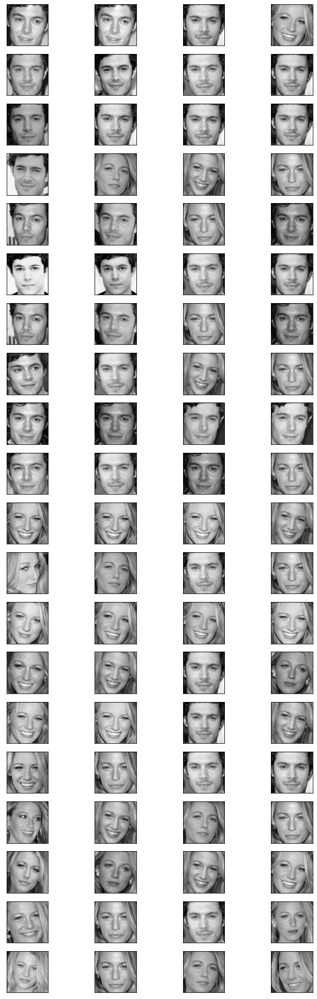

In [ ]:
print("Test Image    |              Closest Training Images                  ")
def plot( rows=20, cols=4):
    plt.figure(figsize = (10,30))
    c = 0
    count = 0
    for i in range(rows * cols):
        plt.subplot(rows, cols, i + 1)
        if (i%4 == 0):
          plt.imshow(X_test1[c].reshape((200, 200)), cmap=plt.cm.gray)
          plt.xticks(())
          plt.yticks(())
          c = c + 1
        else:
          plt.imshow(X_train1[neigh[c-1][count]].reshape((200, 200)), cmap=plt.cm.gray)
          plt.xticks(())
          plt.yticks(())
          count = count + 1
          if count > 2:
            count = 0
plot()

We will test the classifier by subjecting it to classify images in the test set containing images of Person C and Person D.

Accuracy: 0.9


              precision    recall  f1-score   support

         0.0       1.00      0.80      0.89        10
         1.0       0.83      1.00      0.91        10

    accuracy                           0.90        20
   macro avg       0.92      0.90      0.90        20
weighted avg       0.92      0.90      0.90        20

Accuracy :  90.0 %


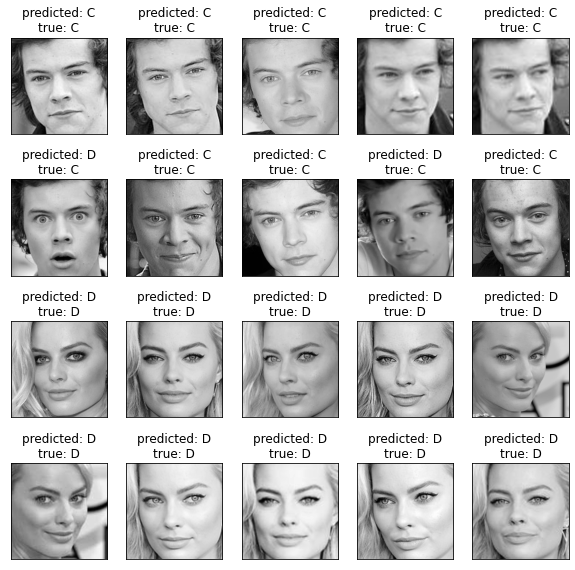

In [ ]:
Z_test1 = np.zeros((len(test_faces_person_C) + len(test_faces_person_D), height * width))
z_test = np.zeros(len(test_faces_person_C) + len(test_faces_person_D))
for i, person in enumerate(test_faces_person_C):
    z_test[i] = int(0)
    Z_test1[i, :] = cv2.cvtColor(cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_CUBIC), cv2.COLOR_BGR2GRAY).flatten()
for i, person in enumerate(test_faces_person_D, start=len(test_faces_person_C)):
    z_test[i] = int(1)
    Z_test1[i, :] = cv2.cvtColor(cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_CUBIC), cv2.COLOR_BGR2GRAY).flatten()

scaler = MinMaxScaler()
target_names = ['Person C', 'Person D']
Z_test = scaler.fit_transform(Z_test1)
Z_test_pca = pca.transform(Z_test)

y_pred = clf.predict(Z_test_pca)
#print(clf.kneighbors(X=hog_features_test, n_neighbors=1, return_distance=True))
#print(y_pred)

print("Accuracy: "+str(accuracy_score(z_test, y_pred)))
print('\n')
print(classification_report(z_test, y_pred))

cm=confusion_matrix(z_test, y_pred, labels=labels)
print("Accuracy : ", accuracy(cm)*100, "%")

neigh = knn.kneighbors(X=Z_test_pca, n_neighbors=3, return_distance=False)

# Visualization

target_names = ['Person C', 'Person D'] 
prediction_titles = list(titles(y_pred, z_test, target_names))
plot_gallery(Z_test1, prediction_titles, height, width)

We obtain a 90% accuracy on the test set containing images of Person C and Person D, which is quite satisfactory. Now, for each test image, lets observe the three closest images in the training set. 

Test Image    |              Closest Training Images                  


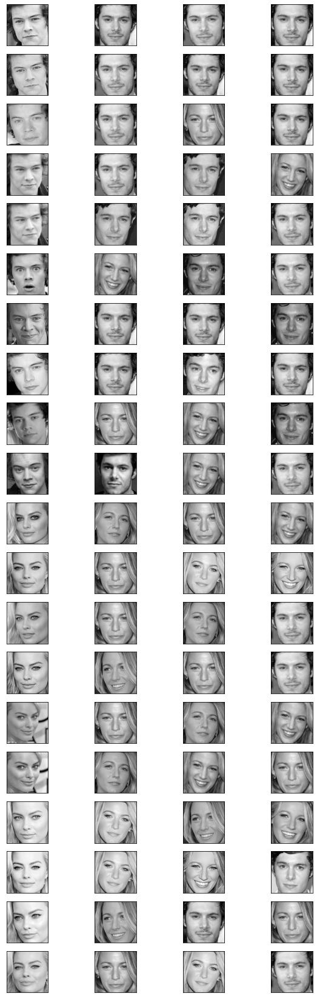

In [ ]:
print("Test Image    |              Closest Training Images                  ")
def plot( rows=20, cols=4):
    plt.figure(figsize = (10,30))
    c = 0
    count = 0
    for i in range(rows * cols):
        plt.subplot(rows, cols, i + 1)
        if (i%4 == 0):
          plt.imshow(Z_test1[c].reshape((200, 200)), cmap=plt.cm.gray)
          plt.xticks(())
          plt.yticks(())
          c = c + 1
        else:
          plt.imshow(X_train1[neigh[c-1][count]].reshape((200, 200)), cmap=plt.cm.gray)
          plt.xticks(())
          plt.yticks(())
          count = count + 1
          if count > 2:
            count = 0
plot()

# **5.6) Identification using CNN**

* KNeighborsClassifier implements learning based on the 
nearest neighbors of each query point, where K is an integer value specified by us. 
* The optimal choice of the value of K is highly data-dependent: in general a larger suppresses the effects of noise, but makes the classification boundaries less distinct. We will treat K as a hyper-parameter and tune it used a Grid Search technique which will perform an exhaustive search over the K parameter for our classifier using a (Stratified) 10 Fold Cross Validation method.
* Weights = 'distance' assigns weights proportional to the inverse of the distance from the query point which means that closer neighbors of a query point will have a greater influence than neighbors which are further away. 
* Setting algorithm parameter to 'ball_tree' will attempt to use the BallTree algorithm to compute the nearest neighbors.
* The leaf size affects the speed of the construction and query, as well as the memory required to store the tree. We will set this to 150 which you can modify based on trial-and-error method or by using a hypertuner. 
* The distance metric we will use is the minkowski metric, and with p=2 is equivalent to the standard Euclidean metric.
* The n_jobs parameter specifies the number of parallel jobs to run for neighbors search. -1 means using all processors.
* Once the Grid Search algorithm identifies the optimal value for parameter K, it will refit our Knn Classifier using the best found K on the whole training dataset.

Fitting 10 folds for each of 36 candidates, totalling 360 fits


[Parallel(n_jobs=5)]: Using backend LokyBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done  34 tasks      | elapsed:    0.8s
[Parallel(n_jobs=5)]: Done 226 tasks      | elapsed:    4.8s
[Parallel(n_jobs=5)]: Done 360 out of 360 | elapsed:    7.6s finished


{'n_neighbors': 1}
Accuracy: 1.0


              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        10
         1.0       1.00      1.00      1.00        10

    accuracy                           1.00        20
   macro avg       1.00      1.00      1.00        20
weighted avg       1.00      1.00      1.00        20

Accuracy :  100.0 %


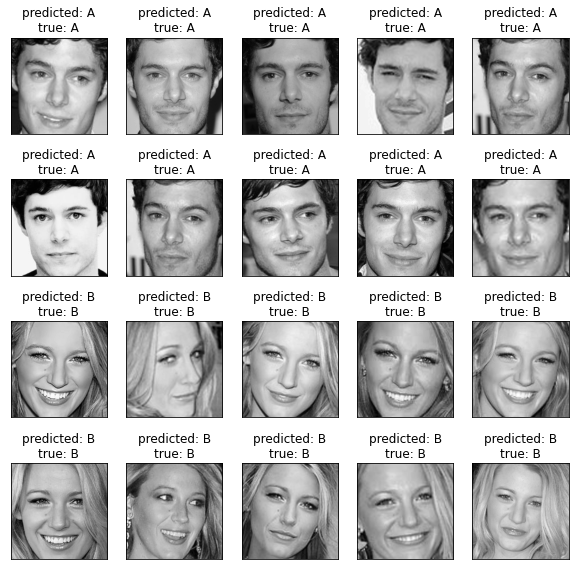

In [ ]:
import os
import sklearn
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.svm import SVC
from sklearn.externals import joblib
from keras.engine import  Model
from keras.layers import Input
from keras_vggface.vggface import VGGFace
import tensorflow as tf

height = 200
width = 200

X_train = np.zeros((len(training_faces_person_A) + len(training_faces_person_B), width , height, 3))
y_train = np.zeros(len(training_faces_person_A) + len(training_faces_person_B))
X_test = np.zeros((len(test_faces_person_A) + len(test_faces_person_B), width, height, 3))
y_test = np.zeros(len(test_faces_person_A) + len(test_faces_person_B))

for i, person in enumerate(training_faces_person_A):
    y_train[i] = int(0)
    X_train[i] = cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_CUBIC)
for i, person in enumerate(training_faces_person_B, start=len(training_faces_person_A)):
    y_train[i] = int(1)
    X_train[i] = cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_CUBIC)

for i, person in enumerate(test_faces_person_A):
    y_test[i] = int(0)
    X_test[i] = cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_CUBIC)
for i, person in enumerate(test_faces_person_B, start=len(test_faces_person_A)):
    y_test[i] = int(1)
    X_test[i] = cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_CUBIC)
    
vgg_features = VGGFace(include_top=False, input_shape=(height, width, 3), pooling='avg') # pooling: None, avg or max
vectors_vgg_train = vgg_features.predict(X_train)
vectors_vgg_test = vgg_features.predict(X_test)

knn = KNeighborsClassifier( weights='distance', algorithm='ball_tree', leaf_size=150, p=2, metric='minkowski', metric_params=None, n_jobs=-1)
knn.fit(vectors_vgg_train,y_train)
param = {"n_neighbors" :  np.arange(1, 37)}
clf = GridSearchCV(knn, param, refit=True,
      cv=10, n_jobs=5, verbose=3)
clf.fit(vectors_vgg_train,y_train)
y_pred = clf.predict(vectors_vgg_test)
print(clf.best_params_)
#print(hog_features)
neigh = knn.kneighbors(X=vectors_vgg_test, n_neighbors=3, return_distance=False)
#print(neigh[0][0])

print("Accuracy: "+str(accuracy_score(y_test, y_pred)))
print('\n')
print(classification_report(y_test, y_pred))

labels = [0,1]
def accuracy(confusion_matrix):
   diagonal_sum = confusion_matrix.trace()
   sum_of_all_elements = confusion_matrix.sum()
   return diagonal_sum / sum_of_all_elements
cm=confusion_matrix(y_test, y_pred, labels=labels)
print("Accuracy : ", accuracy(cm)*100, "%")

# Visualization
def plot_gallery(images, tit, h, w, rows=4, cols=5):
    plt.figure(figsize = (10,10))
    for i in range(rows * cols):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(images[i].reshape((200, 200)), cmap=plt.cm.gray)
        plt.title(tit[i])
        plt.xticks(())
        plt.yticks(())
 
def titles(y_predict, y_test, target_names):
    for i in range(y_predict.shape[0]):
        pred_name = target_names[int(y_predict[i])].split(' ')[-1]
        true_name = target_names[int(y_test[i])].split(' ')[-1]
        yield 'predicted: {0}\ntrue: {1}'.format(pred_name, true_name)
target_names = ['Person A', 'Person B'] 
prediction_titles = list(titles(y_pred, y_test, target_names))
plot_gallery(X_test1, prediction_titles, height, width)

We obtain a perfect accuracy on the test set containing images of Person A and Person B. Also, note the optimal value of K found after exhaustive search, displayed right above the accuracy. Now, for each test image, lets observe the three closest images in the training set. 

Test Image    |              Closest Training Images                  


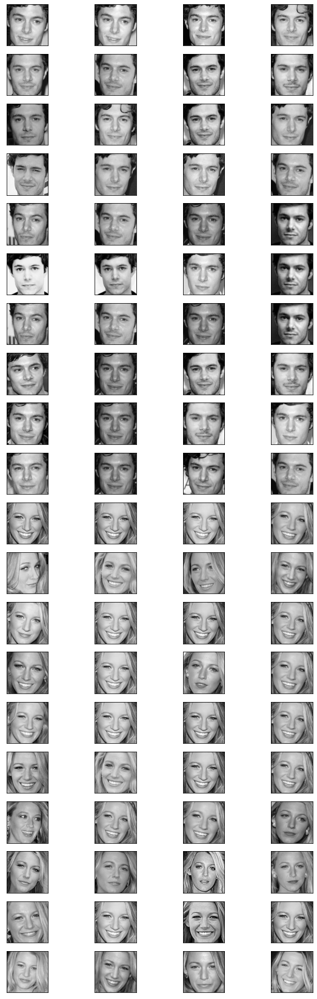

In [ ]:
print("Test Image    |              Closest Training Images                  ")
def plot( rows=20, cols=4):
    plt.figure(figsize = (10,30))
    c = 0
    count = 0
    for i in range(rows * cols):
        plt.subplot(rows, cols, i + 1)
        if (i%4 == 0):
          plt.imshow(X_test1[c].reshape((200, 200)), cmap=plt.cm.gray)
          plt.xticks(())
          plt.yticks(())
          c = c + 1
        else:
          plt.imshow(X_train1[neigh[c-1][count]].reshape((200, 200)), cmap=plt.cm.gray)
          plt.xticks(())
          plt.yticks(())
          count = count + 1
          if count > 2:
            count = 0
plot()

We will test the classifier by subjecting it to classify images in the test set containing images of Person C and Person D.

Accuracy: 1.0


              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        10
         1.0       1.00      1.00      1.00        10

    accuracy                           1.00        20
   macro avg       1.00      1.00      1.00        20
weighted avg       1.00      1.00      1.00        20

Accuracy :  100.0 %


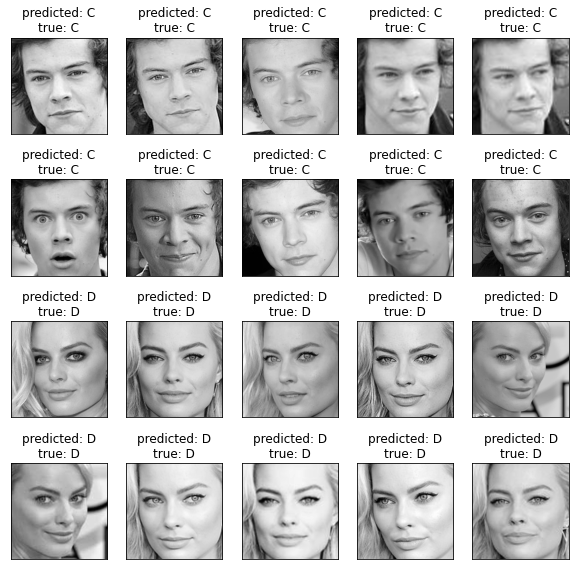

In [ ]:
Z_test = np.zeros((len(test_faces_person_C) + len(test_faces_person_D), width , height, 3))
z_test = np.zeros(len(test_faces_person_C) + len(test_faces_person_D))

for i, person in enumerate(test_faces_person_C):
    z_test[i] = int(0)
    Z_test[i] = cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_CUBIC)
for i, person in enumerate(test_faces_person_D, start=len(test_faces_person_C)):
    z_test[i] = int(1)
    Z_test[i] = cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_CUBIC)

vectors_vgg_test_CD = vgg_features.predict(Z_test)

y_pred = clf.predict(vectors_vgg_test_CD)
#print(clf.kneighbors(X=hog_features_test, n_neighbors=1, return_distance=True))
#print(y_pred)

print("Accuracy: "+str(accuracy_score(z_test, y_pred)))
print('\n')
print(classification_report(z_test, y_pred))

cm=confusion_matrix(z_test, y_pred, labels=labels)
print("Accuracy : ", accuracy(cm)*100, "%")

neigh = knn.kneighbors(X=vectors_vgg_test_CD, n_neighbors=3, return_distance=False)

# Visualization

target_names = ['Person C', 'Person D'] 
prediction_titles = list(titles(y_pred, z_test, target_names))
plot_gallery(Z_test1, prediction_titles, height, width)


We obtain a perfect accuracy on the test set containing images of Person C and Person D, which was expected given the feature representation we have used. Now, for each test image, lets observe the three closest images in the training set. 

Test Image    |              Closest Training Images                  


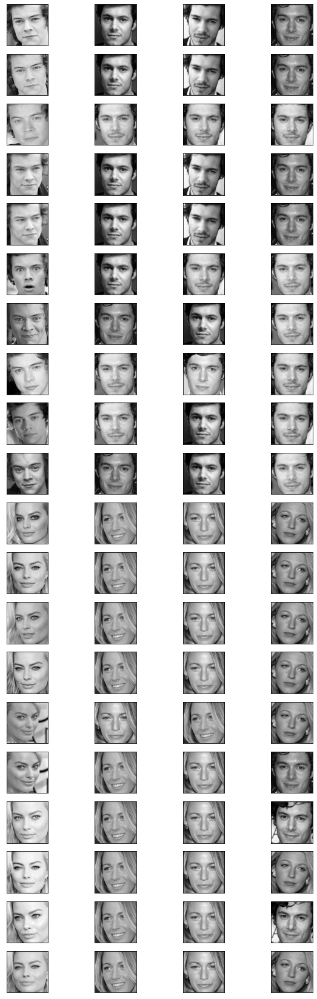

In [ ]:
print("Test Image    |              Closest Training Images                  ")
def plot( rows=20, cols=4):
    plt.figure(figsize = (10,30))
    c = 0
    count = 0
    for i in range(rows * cols):
        plt.subplot(rows, cols, i + 1)
        if (i%4 == 0):
          plt.imshow(Z_test1[c].reshape((200, 200)), cmap=plt.cm.gray)
          plt.xticks(())
          plt.yticks(())
          c = c + 1
        else:
          plt.imshow(X_train1[neigh[c-1][count]].reshape((200, 200)), cmap=plt.cm.gray)
          plt.xticks(())
          plt.yticks(())
          count = count + 1
          if count > 2:
            count = 0
plot()

# **5.7) Improve Performance (impress TAs)**

The results for classification using HOG features weren't impressive in sections 5.1 and 5.4 with SVM and Knn respectively. We will try something out of the box to get a much better performance.  

We will feed the HOG features into three classifiers, namely, Extra trees Classifier, Random Trees Classifier and the Gradient Boosting Classifier. The tree classifiers are further processed by a ADA Boosting algorithm.

In [ ]:
import numpy as np 
from matplotlib import pyplot as plt
from skimage import color
from skimage.feature import hog
from sklearn.metrics import classification_report,accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.model_selection import cross_val_score

height = 128
width = 128

X_train = np.zeros((len(training_faces_person_A) + len(training_faces_person_B), width , height, 3))
y_train = np.zeros(len(training_faces_person_A) + len(training_faces_person_B))
X_test = np.zeros((len(test_faces_person_A) + len(test_faces_person_B), width, height, 3))
y_test = np.zeros(len(test_faces_person_A) + len(test_faces_person_B))

for i, person in enumerate(training_faces_person_A):
    y_train[i] = int(0)
    X_train[i] = cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_AREA)
for i, person in enumerate(training_faces_person_B, start=len(training_faces_person_A)):
    y_train[i] = int(1)
    X_train[i] = cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_AREA)
X_train_gray = [ color.rgb2gray(i) for i in X_train]
for i, person in enumerate(test_faces_person_A):
    y_test[i] = int(0)
    X_test[i] = cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_AREA)
for i, person in enumerate(test_faces_person_B, start=len(test_faces_person_A)):
    y_test[i] = int(1)
    X_test[i] = cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_AREA)
X_test_gray = [ color.rgb2gray(i) for i in X_test]

ppc = 16
hog_images = []
hog_features = []
for image in X_train_gray:
    fd,hog_image = hog(image, orientations=10, pixels_per_cell=(ppc,ppc),cells_per_block=(8, 8),feature_vector=True, transform_sqrt=True, block_norm= 'L2',visualize=True)
    hog_image = exposure.rescale_intensity(hog_image, out_range=(0, 255))
    hog_image = hog_image.astype("uint8")
    hog_images.append(hog_image)
    hog_features.append(fd)

hog_images_test = []
hog_features_test = []
for image in X_test_gray:
    fd_test,hog_image_test = hog(image, orientations=10, pixels_per_cell=(ppc,ppc),cells_per_block=(8, 8),feature_vector=True, transform_sqrt=True, block_norm= 'L2',visualize=True)
    hog_image_test = exposure.rescale_intensity(hog_image_test, out_range=(0, 255))
    hog_image_test = hog_image_test.astype("uint8")
    hog_images_test.append(hog_image_test)
    hog_features_test.append(fd_test)

The Extra trees Classifier, Random Trees Classifier are two averaging algorithms based on randomized decision trees. Both algorithms are perturb-and-combine techniques, specifically designed for trees. This means a diverse set of classifiers is created by introducing randomness in the classifier construction. The prediction of the ensemble is given as the averaged prediction of the individual classifiers.

 In random forests, each tree in the ensemble is built from a sample drawn with replacement (i.e., a bootstrap sample) from the training set. A random forest is a meta estimator that fits a number of decision tree classifiers on various sub-samples of the dataset and uses averaging to improve the predictive accuracy and control over-fitting. Furthermore, when splitting each node during the construction of a tree, the best split is found either from all input features or a random subset of size max_features(parameter). We set this parameter to auto, which makes max_features as sqrt(number of features). The search for a split does not stop until at least one valid partition of the node samples is found, even if it requires to effectively inspect more than max_features features. The purpose of these two sources of randomness is to decrease the variance of the forest estimator. Indeed, individual decision trees typically exhibit high variance and tend to overfit. The injected randomness in forests yield decision trees with somewhat decoupled prediction errors. By taking an average of those predictions, some errors can cancel out. Random forests achieve a reduced variance by combining diverse trees, sometimes at the cost of a slight increase in bias. We use the gini impurity as the function to measure the quality of a split.

In extremely randomized trees, randomness goes one step further in the way splits are computed. This class implements a meta estimator that fits a number of randomized decision trees (a.k.a. extra-trees) on various sub-samples of the dataset and uses averaging to improve the predictive accuracy and control over-fitting. As in random forests, a random subset of candidate features is used, but instead of looking for the most discriminative thresholds, thresholds are drawn at random for each candidate feature and the best of these randomly-generated thresholds is picked as the splitting rule. This usually allows to reduce the variance of the model a bit more, at the expense of a slightly greater increase in bias. We use the information gain as the function to measure the quality of a split.

In [ ]:
clfd = RandomForestClassifier(n_estimators=100, criterion='gini', max_depth=None, min_samples_split=2, 
                             min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features='auto', 
                             max_leaf_nodes=None, min_impurity_decrease=0.0, min_impurity_split=None, 
                             bootstrap=False, oob_score=False, n_jobs=-1, random_state=0, verbose=50,
                             warm_start=True, class_weight="balanced", ccp_alpha=0.0, max_samples=1)


clfp = ExtraTreesClassifier(n_estimators=100, criterion='entropy', max_depth=None, min_samples_split=2, 
                             min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features='auto', 
                             max_leaf_nodes=None, min_impurity_decrease=0.0, min_impurity_split=None, 
                             bootstrap=False, oob_score=False, n_jobs=-1, random_state=0, verbose=50,
                             warm_start=True, class_weight="balanced", ccp_alpha=0.0, max_samples=1)


In both these tree based classifiers, there are many parameters that can be adjusted and tested, but the main parameters to adjust when using these methods is n_estimators and max_features. The former is the number of trees in the forest. The larger the better, but also the longer it will take to compute. In addition, note that results will stop getting significantly better beyond a critical number of trees. The latter is the size of the random subsets of features to consider when splitting a node. The lower the greater the reduction of variance, but also the greater the increase in bias. In both these classfiers, we set the the number of trees in the forest to 100(default). The maximum number of features to consider when looking for the best split is based on (sqrt(number of features)). Finally, these modules also feature the parallel construction of the trees and the parallel computation of the predictions through the n_jobs parameter. All cores available on the machine are used when we set the parameter to -1. 

An AdaBoost classifier is a meta-estimator that begins by fitting a classifier on the original dataset and then fits additional copies of the classifier on the same dataset but where the weights of incorrectly classified instances are adjusted such that subsequent classifiers focus more on difficult cases. We use AdaBoost Classifier on both of the tree classifiers.
The core principle of AdaBoost is to fit a sequence of tree learners on repeatedly modified versions of the data. The predictions from all of them are then combined through a weighted majority vote (or sum) to produce the final prediction. Each of the tree learners is thereby forced to concentrate on the examples that are missed by the previous ones in the sequence. 

The number of estimators at which boosting is terminated (In case of perfect fit, the learning procedure is stopped early), is controlled by the parameter n_estimators. The learning_rate parameter controls the contribution of the learners in the final combination. The two tree learners learners will be specified through the base_estimator parameter. The tree classifiers act as the base estimators from which the boosted ensembles are built. The SAMME.R algorithm typically converges faster and achieves a lower test error with fewer boosting iterations.

In [ ]:
clf1 = AdaBoostClassifier(n_estimators=100, base_estimator=clfp, learning_rate=1.0, 
                         algorithm='SAMME.R', random_state=None)


clf2 = AdaBoostClassifier(n_estimators=100, base_estimator=clfd, learning_rate=1.0, 
                         algorithm='SAMME.R', random_state=None)


Gradient Tree Boosting or Gradient Boosted Decision Trees (GBDT) is a generalization of boosting to arbitrary differentiable loss functions. GBDT is an accurate and effective off-the-shelf procedure that we will use as well, for our face classification problem. GB builds an additive model in a forward stage-wise fashion.  It allows for the optimization of arbitrary differentiable loss functions. 

The number of weak learners (trees) is controlled by the parameter n_estimators which we set to 10. For loss ‘exponential’ gradient boosting recovers the AdaBoost algorithm. The function to measure the quality of a split is set to “friedman_mse” for the mean squared error with improvement score by Friedman, as it can provide a better approximation. Tolerance for the early stopping is set to 0.0001. Complexity parameter used for Minimal Cost-Complexity Pruning is set to 0 which means that no pruning will be performed.

In [ ]:
clf3 = GradientBoostingClassifier(loss='exponential', learning_rate=1.0,n_estimators=10, 
                                  subsample=1.0, criterion='friedman_mse', min_samples_split=2,
                                  min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_depth=1,
                                   min_impurity_decrease=0.0, min_impurity_split=None, init=None,
                                   random_state=0, max_features=None, verbose=0,
                                   warm_start=False, presort='deprecated', validation_fraction=0.1,
                                   n_iter_no_change=None, tol=0.0001, ccp_alpha=0.0)



Finally, VotingClassifier is used to combine conceptually different machine learning classifiers we have used so far in this section and use a majority vote or the average predicted probabilities (soft vote, returns the class label as argmax of the sum of predicted probabilities) to predict the class labels. We use such a classifier as it is useful for a set of equally well performing models in order to balance out their individual weaknesses.



Specific weights is assigned to each classifier via the weights parameter. When weights are provided, the predicted class probabilities for each classifier are collected, multiplied by the classifier weight, and averaged. We assign weights 1 ,3 ,2 to the extra trees classifier, random forest classifier and the gradient boosting classifier respectively. The final class label is then derived from the class label with the highest average probability.

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done  15 tasks      | elapsed:    0.0s
[Para

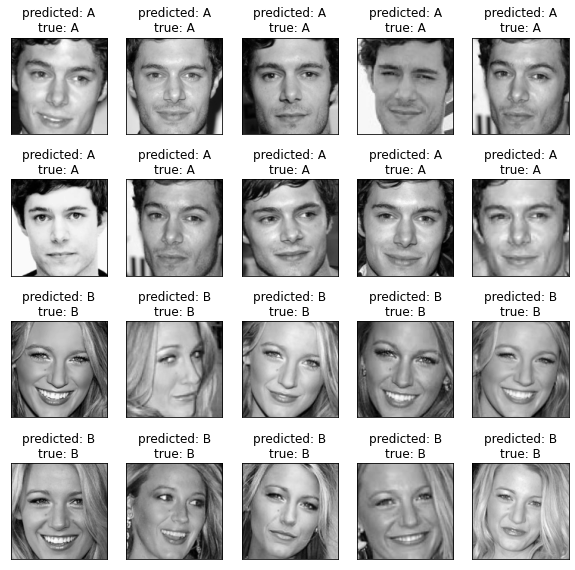

In [ ]:
clf = VotingClassifier(estimators=[('et_ada', clf1), ('rf_ada', clf2), ('gb', clf3)],
                         voting='soft', weights=[1, 3, 2], n_jobs=-1, flatten_transform=True)

#param = {"n_estimators" :  np.arange(1, 300)}
#clf = GridSearchCV(clfp, param, refit=True,
#      cv=10, n_jobs=5, verbose=3)
#hog_features = np.array(hog_features)
clf.fit(hog_features,y_train)
y_pred = clf.predict(hog_features_test)
#print(clf.best_params_)
#print(hog_features)

'''for clf, label in zip([clf1, clf2, clf3, clf], ['Extra Trees Forest', 'Random Forest', 'Gradient Boosted', 'Ensemble']):
     scores = cross_val_score(clf, hog_features, y_train, scoring='accuracy', cv=10)
     print("Accuracy: %0.2f (+/- %0.2f) [%s]" % (scores.mean(), scores.std(), label))'''

print("Accuracy: "+str(accuracy_score(y_test, y_pred)))
print('\n')
print(classification_report(y_test, y_pred))

labels = [0,1]
def accuracy(confusion_matrix):
   diagonal_sum = confusion_matrix.trace()
   sum_of_all_elements = confusion_matrix.sum()
   return diagonal_sum / sum_of_all_elements
cm=confusion_matrix(y_test, y_pred, labels=labels)
print("Accuracy : ", accuracy(cm)*100, "%")
target_names = ['Person A', 'Person B']

# Visualization
def plot_gallery(images, tit, h, w, rows=4, cols=5):
    plt.figure(figsize = (10,10))
    for i in range(rows * cols):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(images[i].reshape((128, 128)), cmap=plt.cm.gray)
        plt.title(tit[i])
        plt.xticks(())
        plt.yticks(())
 
def titles(y_pred, y_test, target_names):
    for i in range(y_pred.shape[0]):
        pred_name = target_names[int(y_pred[i])].split(' ')[-1]
        true_name = target_names[int(y_test[i])].split(' ')[-1]
        yield 'predicted: {0}\ntrue: {1}'.format(pred_name, true_name)
 
prediction_titles = list(titles(y_pred, y_test, target_names))
plot_gallery(X_test_gray, prediction_titles, height, width)

The relative rank (i.e. depth) of a feature used as a decision node in a tree can be used to assess the relative importance of that feature with respect to the predictability of the target variable. Features used at the top of the tree contribute to the final prediction decision of a larger fraction of the input samples. The expected fraction of the samples they contribute to can thus be used as an estimate of the relative importance of the features. In scikit-learn, the fraction of samples a feature contributes to is combined with the decrease in impurity from splitting them to create a normalized estimate of the predictive power of that feature.

 Gradient Tree Boosting uses decision trees of fixed size as weak learners. Decision trees have a number of abilities that make them valuable for boosting, namely the ability to handle data of mixed type and the ability to model complex functions. By averaging the estimates of predictive ability over several randomized trees one can reduce the variance of such an estimate and use it for feature selection.

We expected a perfect accuracy for our test set containing images similar to our training set, but the real test is when we deploy our classifier on our test set containing images of Person C and Person D.

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done  15 tasks      | elapsed:    0.0s
[Para

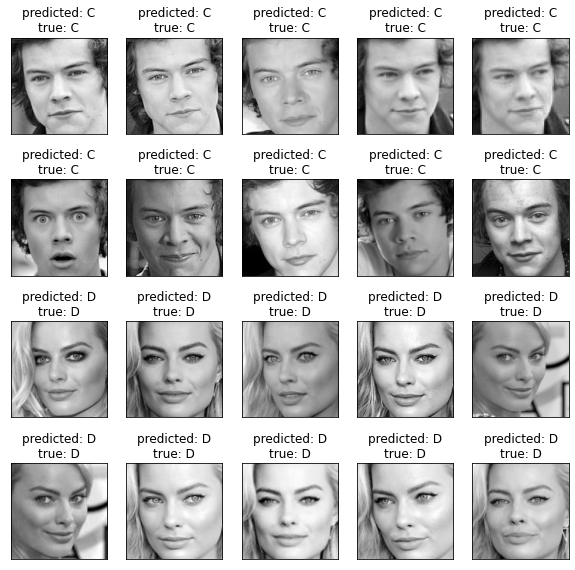

In [ ]:
X_test = np.zeros((len(test_faces_person_C) + len(test_faces_person_D), width, height, 3))
y_test = np.zeros(len(test_faces_person_C) + len(test_faces_person_D))

for i, person in enumerate(test_faces_person_C):
    y_test[i] = int(0)
    X_test[i] = cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_AREA)
for i, person in enumerate(test_faces_person_D, start=len(test_faces_person_C)):
    y_test[i] = int(1)
    X_test[i] = cv2.resize(person, dsize=(width, height), interpolation=cv2.INTER_AREA)
X_test_gray = [ color.rgb2gray(i) for i in X_test]

hog_images_test = []
hog_features_test = []
for image in X_test_gray:
    fd_test,hog_image_test = hog(image, orientations=10, pixels_per_cell=(ppc,ppc),cells_per_block=(8, 8),feature_vector=True, transform_sqrt=True, block_norm= 'L2',visualize=True)
    hog_image_test = exposure.rescale_intensity(hog_image_test, out_range=(0, 255))
    hog_image_test = hog_image_test.astype("uint8")
    hog_images_test.append(hog_image_test)
    hog_features_test.append(fd_test)

y_pred = clf.predict(hog_features_test)
#print(clf.kneighbors(X=hog_features_test, n_neighbors=1, return_distance=True))
#print(y_pred)

print("Accuracy: "+str(accuracy_score(y_test, y_pred)))
print('\n')
print(classification_report(y_test, y_pred))

cm=confusion_matrix(y_test, y_pred, labels=labels)
print("Accuracy : ", accuracy(cm)*100, "%")

# Visualization

target_names = ['Person C', 'Person D'] 
prediction_titles = list(titles(y_pred, y_test, target_names))
plot_gallery(X_test_gray, prediction_titles, height, width)

The variance reduction is significant hence yielding an overall better model with a near perfect accuracy, way better than what we have seen earlier. ***Hence, mission accomplished.***


# **6) Discussion**

We started off by creating a HOG feature descriptor. This feature descriptor, like all others, drastically reduces the storage size needed per image, meaning that it preserves the useful information and throws away all the rest. The useful information in HOG consists of local shape changes primarily. We then fed the HOG features into a SVM classifier with stochastic gradient descent (SGD) learning and into a Knn Classifier. The result wasn't too impressive in both the cases but the method used in the previous section outperformed these more traditional ones to obtain a perfect accuracy. The key takeaway from using HOG is that if we can consistently detect and extract the ROI of our image dataset, the HOG descriptor should definitely be a good choice as an image descriptor to apply, as it’s very powerful and able to obtain good results, especially when applied in conjunction with machine learning classifiers we implemented in the previous section. That being said, it can be tedious to choose the correct parameters as its often non-trivial to tune the  orientations,  pixels_per_cell , and  cells_per_block  parameters. Also, if the the rotation/orientation of the face is consistently different, then the standard implementation of HOG will not perform well, regardless of the classifier we might end up using.

Using PCA for feature selection on supervised learning is not a great idea, since it does not consider the "correlation" between feature and label, and direct select feature with large variance. In other words, we can have a completely useless feature but with large variance in data, and PCA will select it. Also, if all the components of PCA have quite a high variance, there is no 'good' universal stopping rule that allows us to discard some exact 'k' Principal Components, with a guarantee that there will be no 'significant' (especially for our application) loss of data in the compression. Hence, it is not suitable for all sorts of classification problems. For example, in our case, there are 2 classes of images, but if the within class variance is very high as compared to between class variance, PCA might result in discarding the very information that separates the two classes. In other words, if our data is noisy, and the noise variance is more than the variance between means of the two classes, then PCA will keep the noise components, and discard the distinguishing component( This is expected, since PCA is unsupervised). This makes data in the lower space to be indistinguishable. Instead of PCA, we could try to apply Linear Discriminant Analysis (LDA) or  Class-Augmented PCA. The difference between the two is that LDA is supervised and PCA is not. Also PCA, cannot reveal non-linear subspaces. We can address the non-linearity issue by using kernel PCA which is beyond the scope of this tutorial. But as far as this tutorial is concerned, we have obtained results that show Principal Component Analysis helps improve the outcome of classifiers, Knn and SVM in this case.

A pre-trained deep CNN, VGG network in particular, could be used as a feature extractor for face classification tasks.
The bottleneck feature of the VGG network proved to be a good feature for classification.  
The SVM classifier training on the bottleneck feature has a perfect result, and the classifier seems to work perfectly on the unseen Person C and D test set. Similar performance is obtained using Knn clasifer. But there are some constraints while choosing a suitable classifier such as a low-latency requirement, unimportance of interpretability, not so costly errors and the requirement of the  probability of a data-point belonging to each class. With perfect accuracies on both the validation set(Person A/B) and test set (Person C/D), one might not consider overfitting as an issue. But to be more resistant to possible overfitting, transfer learning technique along with data augmentation and batch normalization can be used with Knn to prevent overfitting.

 The images used in this tutorial were very clean, well centered, of the same size, but when analyzing face image datasets in real time, it is often a lot messier, so it might require quite a lot of preprocessing to obtain satisfying results and the classification accuracy is likely to be lower.

Training these types of classifiers with the feature extraction models that we used, overfitting is always around the corner. Moreover, the training accuracy is almost always 1.0 , which is not usual and can be interpreted as a sign of overfitting. However, the accuracy on the unseen test set (Person C/D), of the models we implemented should in general increase with the number of training images, but due to possible overfitting, it would be interesting to see how the model reacts when the dataset increases.